In [1]:
import os
import sys
import warnings

sys.path.append("./packages/")
warnings.filterwarnings("ignore")

#import calmap
from datetime import datetime
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import plotly_express as px
from scipy.fft import fft
import seaborn as sns
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor

from src.importation_data import load_data_txt
from src.importation_data import load_data_csv
#from Vizualizer import GeneralPresentator, PatternAnalyzer, DataPlotter
#from Processing import DataProcessor
#from FeatureEngineering import FeatureEngineer
#from FeatureSelection import filter_correlated_variables

# visualisation 
import plotly.express as px
import calplot as calmap
#!pip install --upgrade nbformat
import pandas as pd
import matplotlib.pyplot as plt
from src.calendarplot import create_year_calendar
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from src.plot_time_series import plot_validations_by_station
from src.plot_time_series import plot_vald_total_gaussian
from src.plot_time_series import plot_acf_pacf_groups

# feature engineering
from src.feature_engineering  import pipeline_feature_engineering
from sklearn.ensemble import RandomForestRegressor

# modelisation


---

## 0. Import et mise en forme de la data

> Importation

In [2]:
from src.data_concated import df_concated
df = df_concated()
df

,DATE,LIBELLE_ARRET,VALD_TOTAL,ANNEE,MOIS,JOUR
0,2015-01-01,ABBESSES,731,2015,1,1
1,2015-01-01,ABLON,110,2015,1,1
2,2015-01-01,ACHERES-GRAND-CORMIER,10,2015,1,1
3,2015-01-01,ACHERES-VILLE,439,2015,1,1
4,2015-01-01,AEROPORT CHARLES DE GAULLE 1,1257,2015,1,1
...,...,...,...,...,...,...
2813837,2025-09-30,VOSVES,51,2025,9,30
2813838,2025-09-30,VULAINES SUR SE,81,2025,9,30
2813839,2025-09-30,WAGRAM,7597,2025,9,30
2813840,2025-09-30,YERRES,6752,2025,9,30


In [3]:
df.groupby(['LIBELLE_ARRET', 'DATE']).size().sort_values(ascending=False).head(20)


LIBELLE_ARRET  DATE      
ABBESSES       2015-01-01    1
PANTIN         2022-07-26    1
               2022-07-18    1
               2022-07-19    1
               2022-07-20    1
               2022-07-21    1
               2022-07-22    1
               2022-07-23    1
               2022-07-24    1
               2022-07-25    1
               2022-07-27    1
               2022-08-06    1
               2022-07-28    1
               2022-07-29    1
               2022-07-30    1
               2022-07-31    1
               2022-08-01    1
               2022-08-02    1
               2022-08-03    1
               2022-08-04    1
dtype: int64

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2813842 entries, 0 to 2813841
Data columns (total 6 columns):
 #   Column         Dtype         
---  ------         -----         
 0   DATE           datetime64[ns]
 1   LIBELLE_ARRET  object        
 2   VALD_TOTAL     int32         
 3   ANNEE          int32         
 4   MOIS           int32         
 5   JOUR           int32         
dtypes: datetime64[ns](1), int32(4), object(1)
memory usage: 85.9+ MB


## 1. Analyse des données de validation des titres IDFM

Les données utilisées dans ce projet proviennent des **stations de transport en Île-de-France**, couvrant la période de **2015 à 2025**. Elles incluent, pour chaque station et chaque jour, le nombre de validations de titres (`NB_VALD`) pour différentes catégories (`CATEGORIE_TITRE`) telles que Forfait Navigo, Imagine R, Améthyste, etc. Bien que ces données n’aient pas été associées à une problématique spécifique à l’origine, elles constituent une excellente base pour **l’analyse de séries temporelles et la prévision de fréquentation** dans le réseau de transport francilien.  

### Problématiques possibles

Trois types d’analyses peuvent être envisagés sur ce dataset :  

1. **Prédire le nombre total de validations par station et par jour**  
2. **Identifier les périodes de forte affluence pour optimiser la gestion du réseau**  

L’objectif principal est **d’anticiper la fréquentation du réseau** pour améliorer la planification des ressources (train/métro/bus), réduire les engorgements, et adapter l’offre aux besoins réels des voyageurs.  

### Notes sur les données
#### Variables
La base de données brute est composée des variables suivantes :  
- `DATE` : La date de validation (au format yyyy-mm-dd)  
- `CODE_STIF_ARRET` : Identifiant unique de la station  
- `CODE_STIF_TRNS` : Identifiant du réseau ou de la ligne  
- `LIBELLE_ARRET` : Nom de la station  
- `CATEGORIE_TITRE` : Type de titre validé (Forfait Navigo, Imagine R, Améthyste, etc.)  
- `NB_VALD` : Nombre de validations pour cette catégorie de titre et cette station à la date donnée (certaines valeurs initialement textuelles, ex. `"Moins de 5"`, ont été transformées en numériques)  
- `VALD_TOTAL` : Somme des validations pour toutes les catégories de titres pour la station à la date donnée  
Certaines colonnes, comme `NB_VALD`, peuvent contenir des valeurs textuelles (`"Moins de 5"`) qui nécessitent un **nettoyage préalable** avant la conversion en valeurs numériques. Après nettoyage, nous obtenons des séries temporelles fiables pour chaque station et chaque type de titre.  

Nous avons également créé une **colonne `VALD_TOTAL`** correspondant à la somme des validations par station et par jour, afin de disposer d’une métrique agrégée sur laquelle baser les analyses.  

### Horizon temporel et granularité

- **Granularité** : journalière (`t` = 1 jour), avec possibilité d’agrégation mensuelle ou annuelle pour certaines analyses.  
- **Horizon** : la prédiction peut se faire pour le jour suivant ou pour les périodes de pointe à l’intérieur de la journée, selon la problématique (optimisation des trains/métros aux heures de forte affluence).  

### Conclusion

- **Cible principale** : `VALD_TOTAL` (nombre total de validations par station et par jour)  
- **Objectif** : prévoir la fréquentation pour optimiser le réseau, éviter la surcharge et adapter la capacité des trains/bus.  
- **Approche** : analyse de séries temporelles, détection de saisonnalités et tendances, prévision à court terme.

In [5]:
df.isnull().sum()

DATE             0
LIBELLE_ARRET    0
VALD_TOTAL       0
ANNEE            0
MOIS             0
JOUR             0
dtype: int64

In [6]:
liste_gares = df["LIBELLE_ARRET"].unique().tolist()
print(len(liste_gares))
liste_gares[1:10]

1201


['ABLON',
 'ACHERES-GRAND-CORMIER',
 'ACHERES-VILLE',
 'AEROPORT CHARLES DE GAULLE 1',
 'AEROPORT CHARLES DE GAULLE 2-TGV',
 'ALESIA',
 'ALEXANDRE DUMAS',
 'ALLEE DE LA TOUR RENDEZ-VOUS',
 'ALMA-MARCEAU']

## 2. Exploration du jeu de données (Analyse descriptive, statistiques descriptives, visualisation)

In [7]:
STOP

NameError: name 'STOP' is not defined

In [ ]:
import plotly.express as px

fig = px.treemap(
    df,
    path=["ANNEE", "MOIS", "JOUR"],
    values="VALD_TOTAL",
    color="VALD_TOTAL",
    color_continuous_scale="Viridis",
    title="Treemap des validations par année, mois et jour"
)

fig.show()

KeyboardInterrupt: 

In [8]:
df.head(2)

,DATE,LIBELLE_ARRET,VALD_TOTAL,ANNEE,MOIS,JOUR
0,2015-01-01,ABBESSES,731,2015,1,1
1,2015-01-01,ABLON,110,2015,1,1


In [9]:
df["VALD_TOTAL"].describe()

count    2.813842e+06
mean     6.084751e+03
std      1.149572e+04
min      1.000000e+00
25%      6.290000e+02
50%      3.285000e+03
75%      7.807000e+03
max      5.588680e+05
Name: VALD_TOTAL, dtype: float64

In [10]:
df.groupby("ANNEE")["VALD_TOTAL"].describe()

,count,mean,std,min,25%,50%,75%,max
ANNEE,,,,,,,,
2015,258851.0,5768.110144,10078.036930,2.0,462.0,3133.0,7719.00,191347.0
2016,262096.0,6063.185714,10712.068347,2.0,594.0,3302.0,7983.00,208803.0
2017,262876.0,6356.644863,11038.962523,2.0,754.0,3562.0,8248.00,219051.0
2018,260325.0,6432.700198,11209.076477,5.0,744.0,3609.0,8397.00,219271.0
2019,255448.0,6633.214983,12547.615889,5.0,724.0,3611.0,8491.00,304452.0
2020,250928.0,3682.818338,8644.388911,5.0,258.0,1463.0,4432.00,259328.0
2021,259792.0,4809.221523,9226.464625,5.0,629.0,2693.0,6031.00,234708.0
2022,266456.0,6106.382671,11264.692752,5.0,756.0,3606.0,7795.25,255589.0
2023,270236.0,6385.158846,11795.209032,1.0,740.0,3762.0,8187.00,281768.0


In [11]:
top5_frequentation = df.groupby('LIBELLE_ARRET')['VALD_TOTAL'].describe().sort_values(by='mean', ascending=False).head()
top5_frequentation

,count,mean,std,min,25%,50%,75%,max
LIBELLE_ARRET,,,,,,,,
SAINT-LAZARE,3895.0,135153.839538,70643.839714,2.0,90411.00,120625.0,185551.0,558868.0
LA DEFENSE-GRANDE ARCHE,2738.0,118779.453981,63662.648861,9.0,61248.75,119806.0,179056.0,227153.0
LA DEFENSE,1161.0,95037.938846,39871.090809,12270.0,61648.00,98023.0,122011.0,262711.0
GARE DE LYON,3899.0,88706.561682,34855.291962,74.0,60049.00,94590.0,113276.5,267201.0
MONTPARNASSE,3899.0,75364.458323,31312.697063,213.0,51295.50,80304.0,98882.5,228916.0


In [12]:
bottom_frequentation = df.groupby('LIBELLE_ARRET')['VALD_TOTAL'].describe().sort_values(by='mean', ascending=False).tail()
bottom_frequentation

,count,mean,std,min,25%,50%,75%,max
LIBELLE_ARRET,,,,,,,,
VOSVES,3690.0,17.300000,12.839891,1.0,5.0,15.0,26.0,88.0
MONTGEROULT,1120.0,16.567857,10.991866,1.0,7.0,14.0,26.0,46.0
GUILLERVAL,2765.0,13.602170,8.388030,1.0,5.0,14.0,19.0,40.0
THIEUX-NANTOUILLET,2537.0,12.602286,8.537118,2.0,5.0,11.0,19.0,44.0
DUGNY COURNEU,3.0,4.333333,4.041452,2.0,2.0,2.0,5.5,9.0


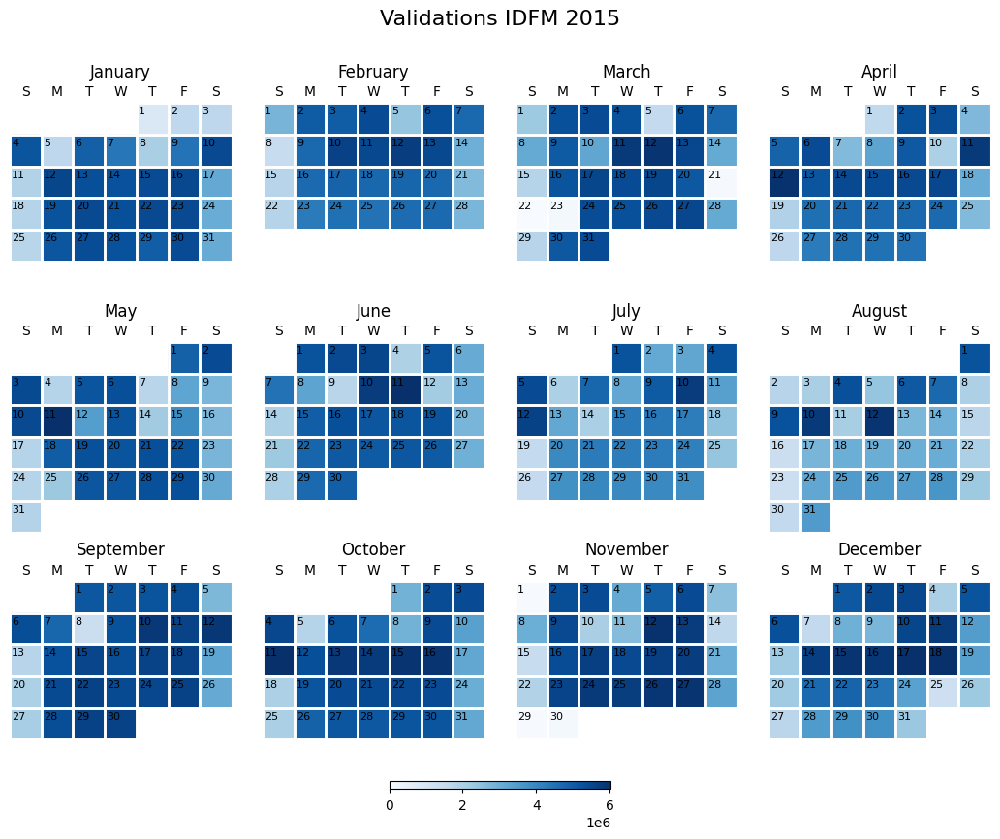

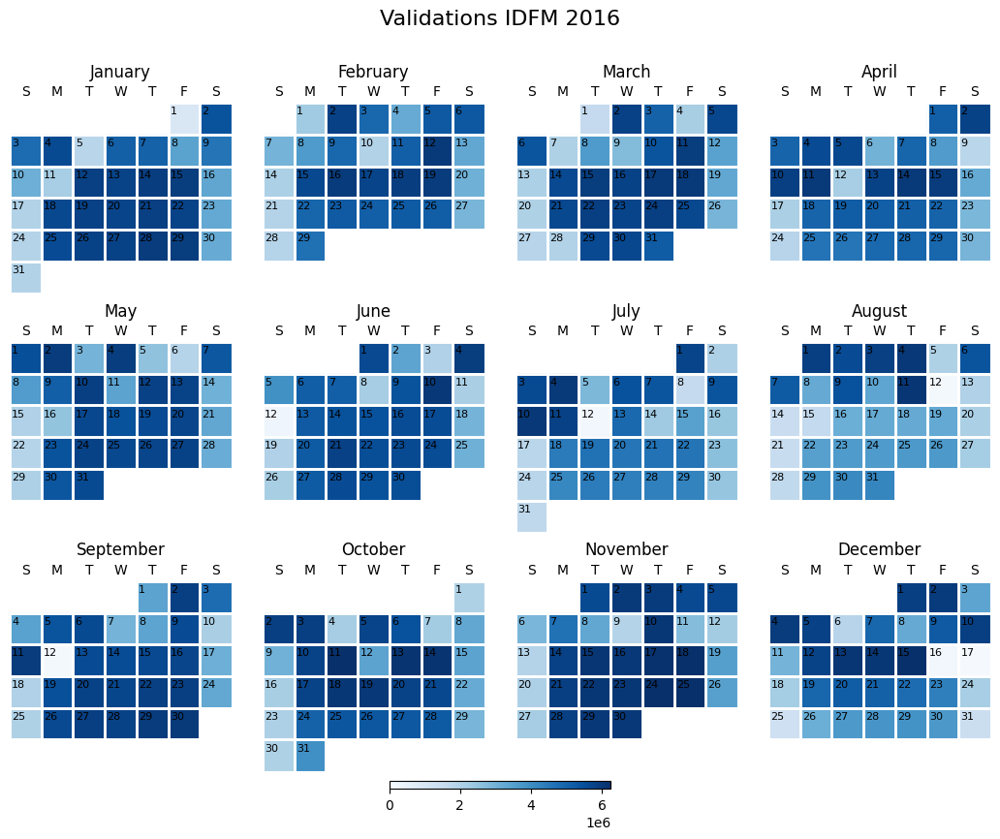

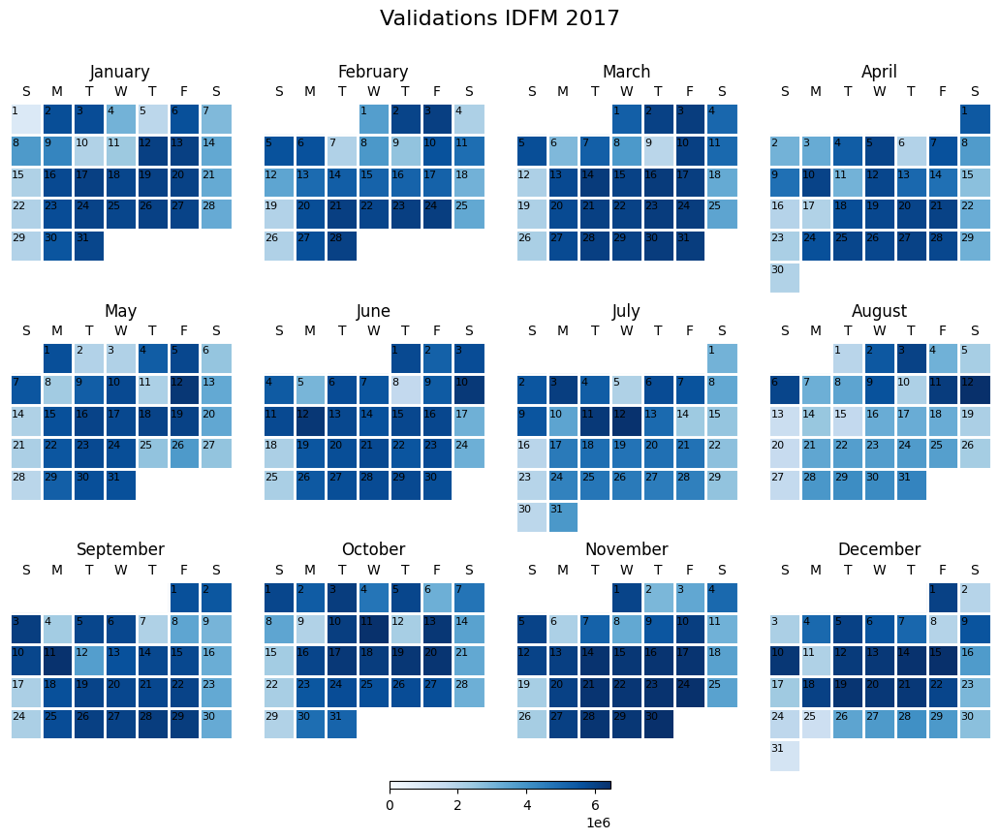

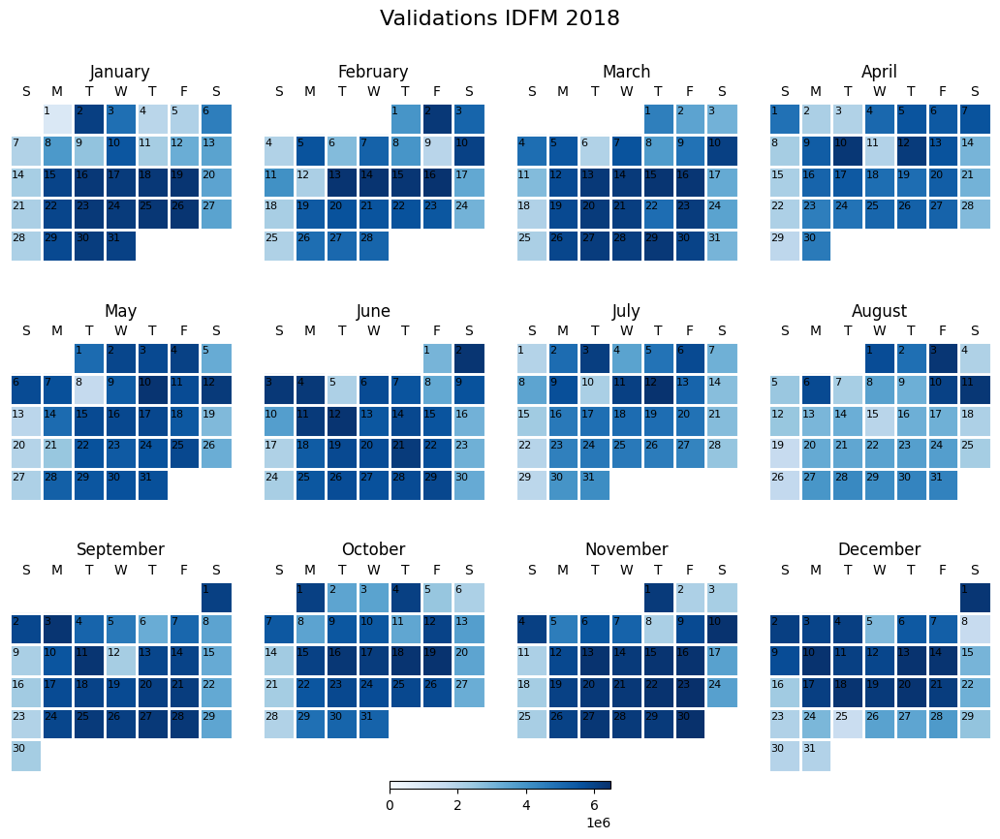

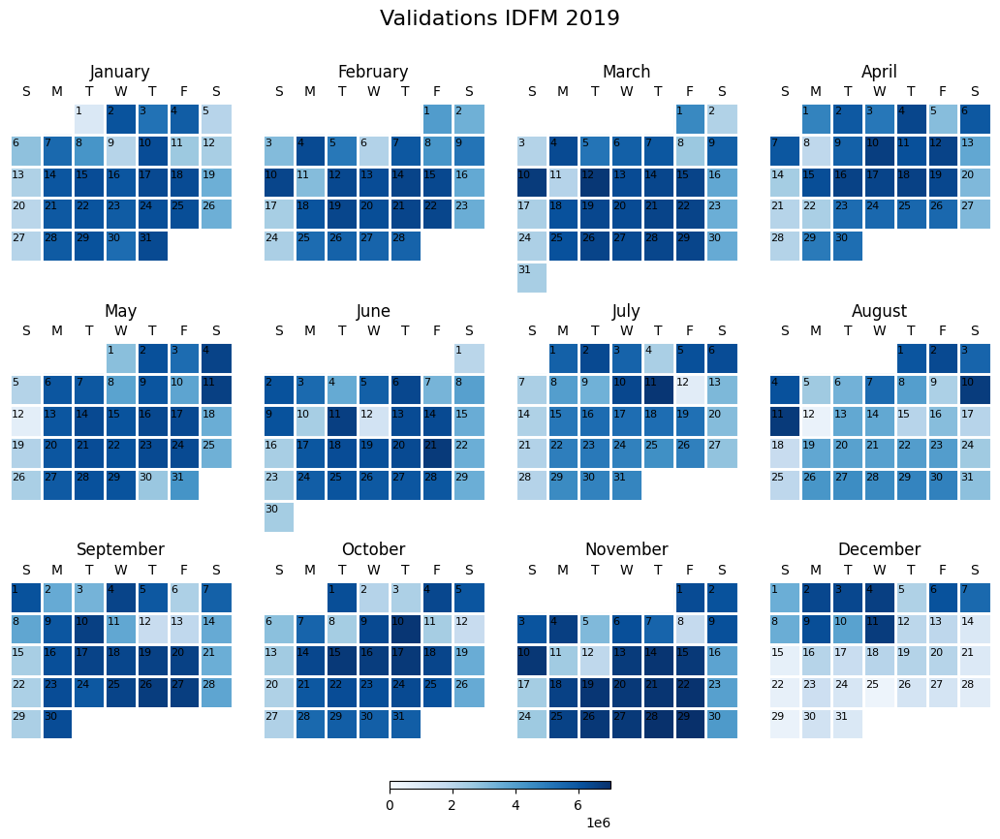

...

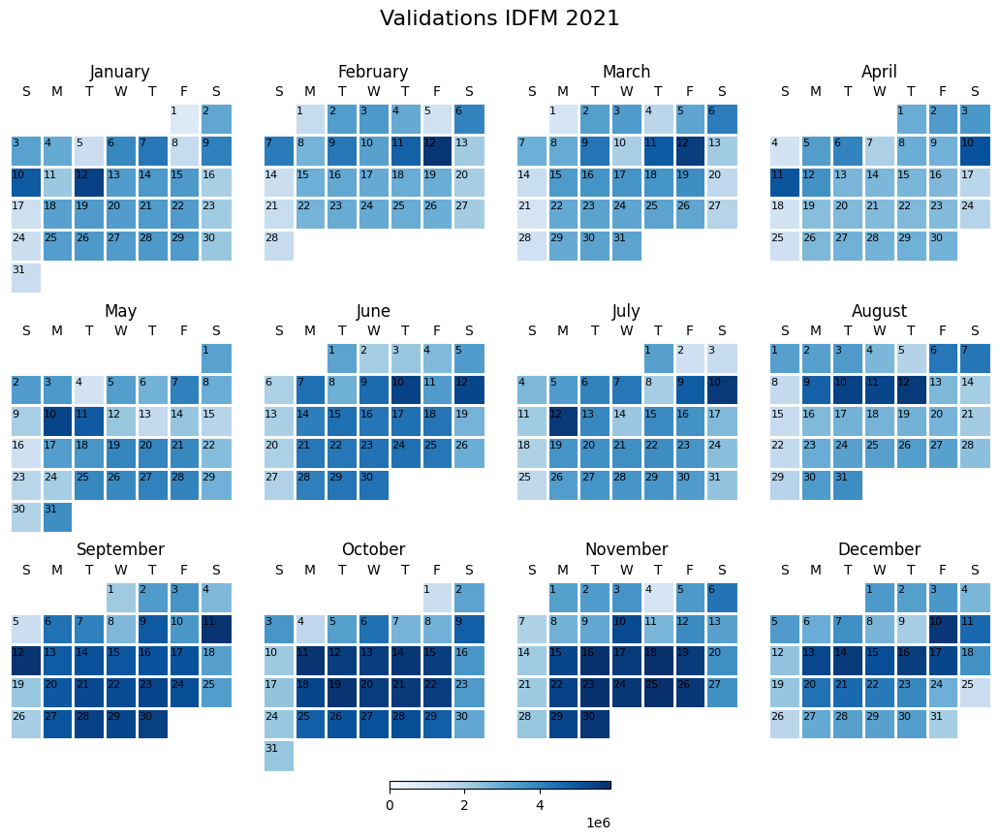

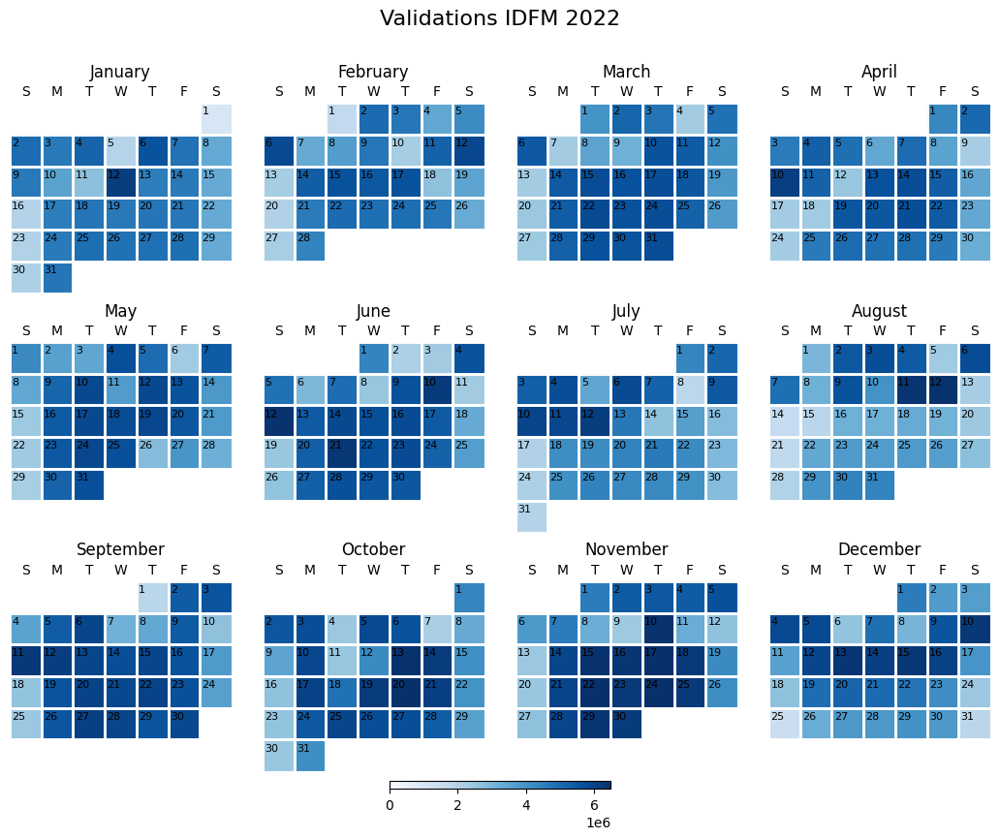

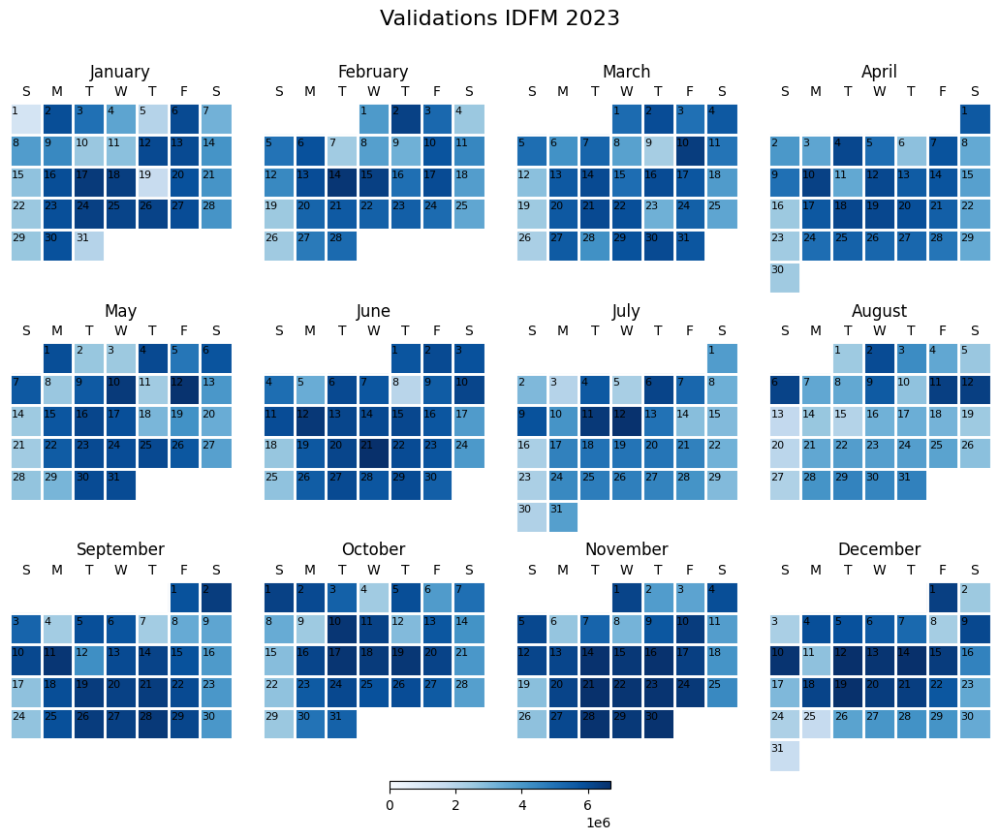

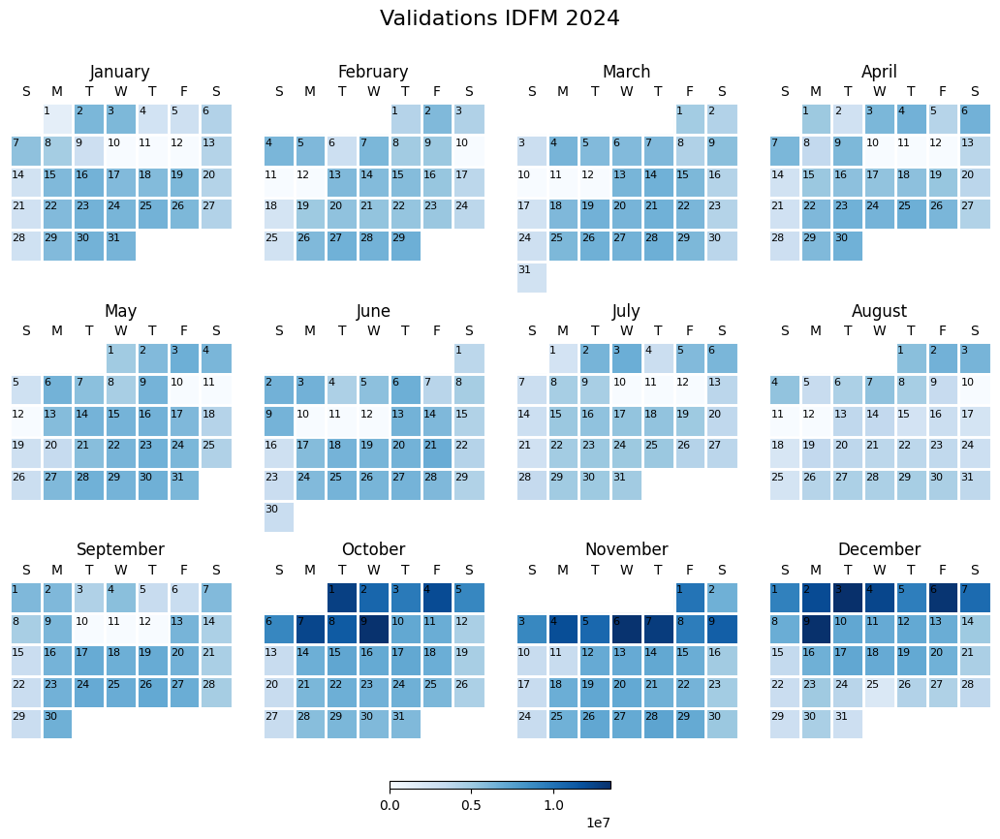

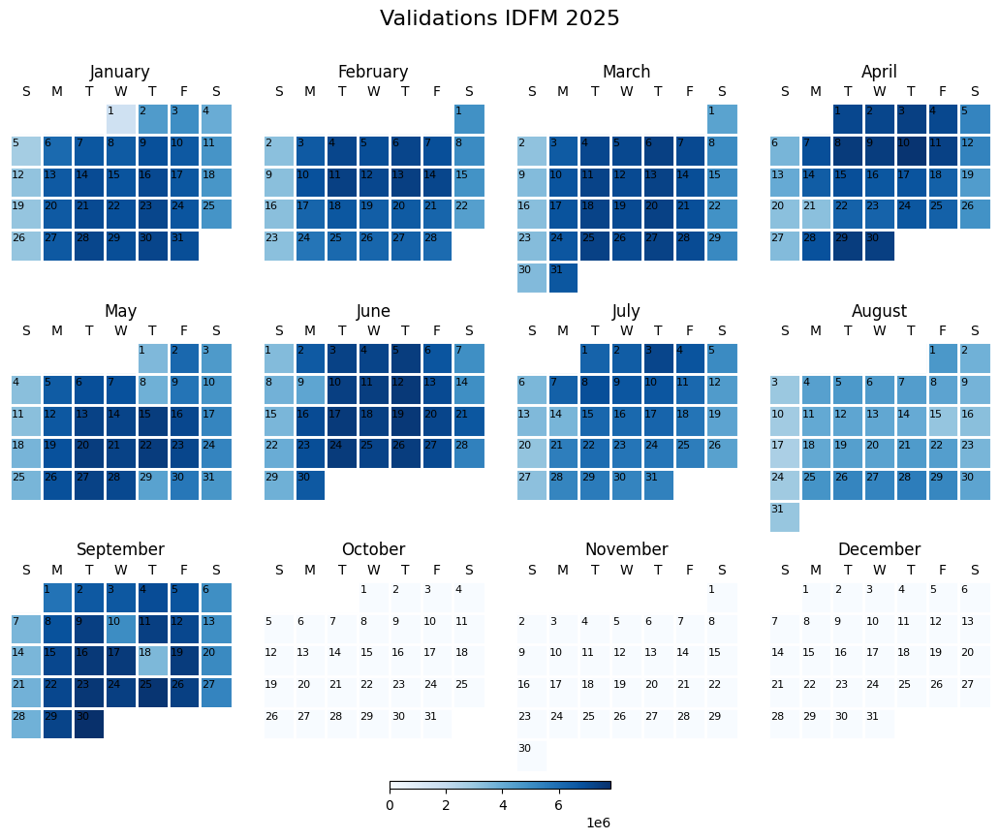

In [13]:
daily_total = df.groupby('DATE')['VALD_TOTAL'].sum()

vmin = daily_total.min()
vmax = daily_total.max()


cmap = "viridis"
for year in range(2015, 2026):
    series_year = daily_total[daily_total.index.year == year]

    hlmap = {}

    # Générer le calendrier
    create_year_calendar(series_year, 
                         year, 
                         title=f'Validations IDFM {year}', 
                         filename=f'calendar_{year}.png',
                         cmap='Blues',
                         hlmap=hlmap,
                         showcb=True)


In [14]:
fig = plot_validations_by_station(
                                  df, 
                                  stations=top5_frequentation.reset_index()["LIBELLE_ARRET"].tolist(), 
                                  start_year=2015, 
                                  end_year=2015,
                                  freq='D'
                        
                                  )

# Plot des validations des boutiques avec beaucoup de frequentation

In [15]:
fig = plot_validations_by_station(
                                  df, 
                                  stations=bottom_frequentation.reset_index()["LIBELLE_ARRET"].tolist(), 
                                  start_year=2015, 
                                  end_year=2025
                                  )

# Plot des validations des boutiques avec peu de frequentation

In [16]:
plot_validations_by_station(df, 
                            stations=bottom_frequentation.reset_index()["LIBELLE_ARRET"].tolist(),
                            start_year=2015, 
                            end_year=2015, 
                            freq='W')

# Plot des validations des boutiques avec peu de frequentation par semaine

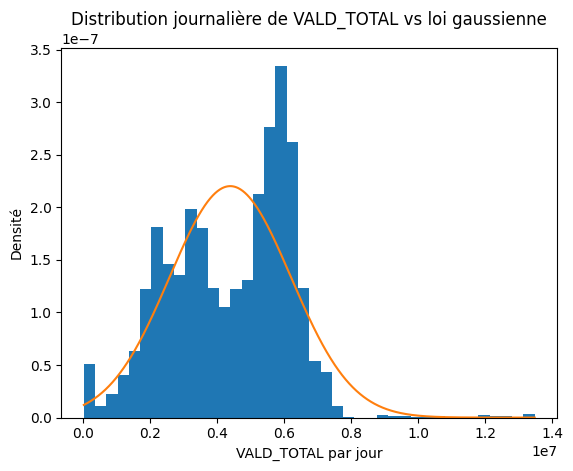

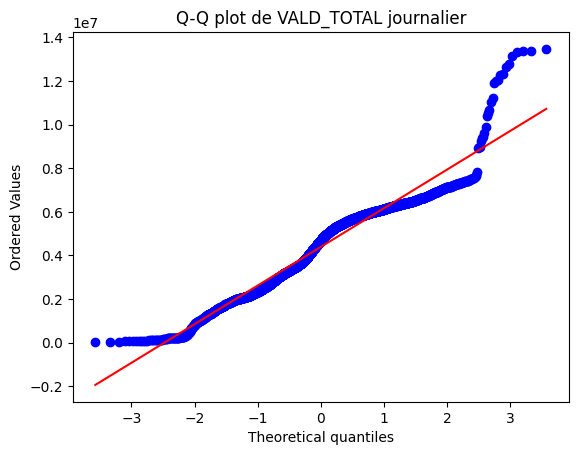

{'mean': 4391261.164914081, 'std': 1812243.8632361428, 'nb_days': 3899}

In [17]:
plot_vald_total_gaussian(
    df,
    date_col='DATE',
    value_col='VALD_TOTAL',
    bins=40
)

# Plot de la distribution des validations totales avec une courbe gaussienne

## Features Engeneering 

In [18]:
df = pipeline_feature_engineering(df, date_col="DATE")
df.sample(5)

,DATE,LIBELLE_ARRET,VALD_TOTAL,ANNEE,MOIS,JOUR,is_holiday,holiday_name,is_school_holiday,is_weekend,...,is_spring,is_summer,is_autumn,is_lockdown,weekend_school_holiday,weekend_holiday,dayofweek_sin,dayofweek_cos,month_sin,month_cos
803143,2018-01-28,ANTONY,4968,2018,1,28,False,NaN,False,True,...,False,False,False,False,False,False,-0.781831,0.623490,5.000000e-01,8.660254e-01
378928,2016-06-15,SCEAUX,1888,2016,6,15,False,NaN,False,False,...,False,True,False,False,False,False,0.974928,-0.222521,1.224647e-16,-1.000000e+00
2531799,2024-09-27,OPERA,27828,2024,9,27,False,NaN,False,False,...,False,False,True,False,False,False,-0.433884,-0.900969,-1.000000e+00,-1.836970e-16
346722,2016-05-01,SANTEUIL-LE-PERCHAY,38,2016,5,1,True,1er mai,False,True,...,True,False,False,False,False,True,-0.781831,0.623490,5.000000e-01,-8.660254e-01
2755924,2025-07-16,J.BONSERGENT,6071,2025,7,16,False,NaN,True,False,...,False,True,False,False,False,False,0.974928,-0.222521,-5.000000e-01,-8.660254e-01


In [19]:
df.shape

(2813842, 21)

In [20]:
pd.set_option('display.max_columns', None)
df.head(2)

,DATE,LIBELLE_ARRET,VALD_TOTAL,ANNEE,MOIS,JOUR,is_holiday,holiday_name,is_school_holiday,is_weekend,is_winter,is_spring,is_summer,is_autumn,is_lockdown,weekend_school_holiday,weekend_holiday,dayofweek_sin,dayofweek_cos,month_sin,month_cos
0,2015-01-01,ABBESSES,731,2015,1,1,True,1er janvier,False,False,True,False,False,False,False,False,False,0.433884,-0.900969,0.5,0.866025
1,2015-01-01,ABLON,110,2015,1,1,True,1er janvier,False,False,True,False,False,False,False,False,False,0.433884,-0.900969,0.5,0.866025


### 6.1 ACF, PACF

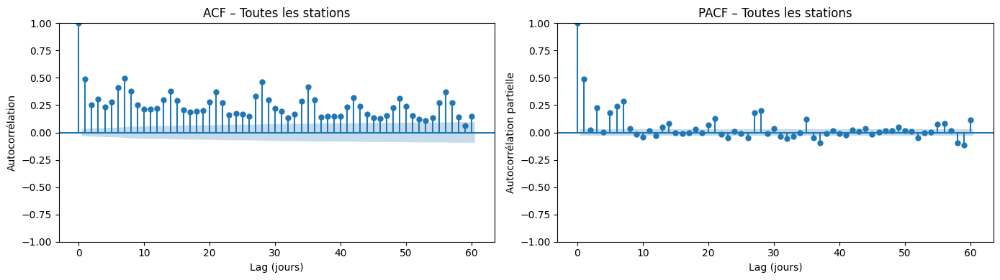

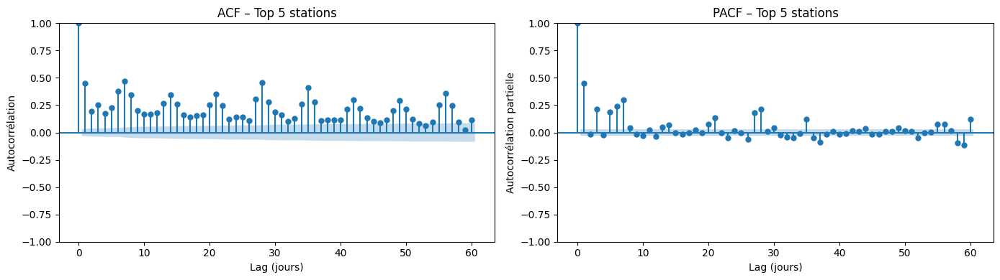

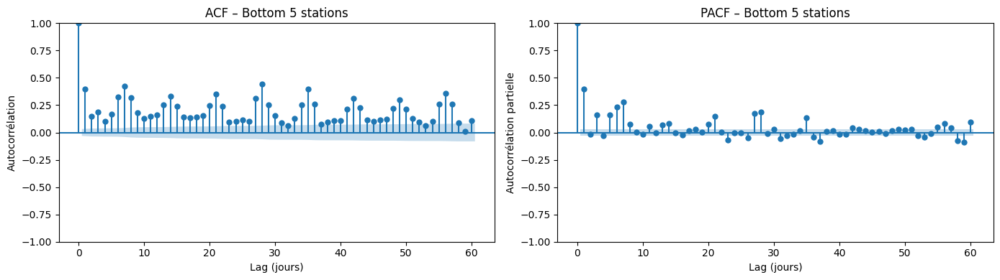

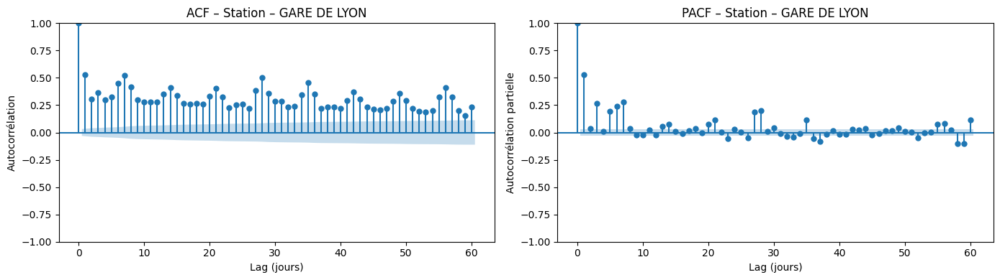

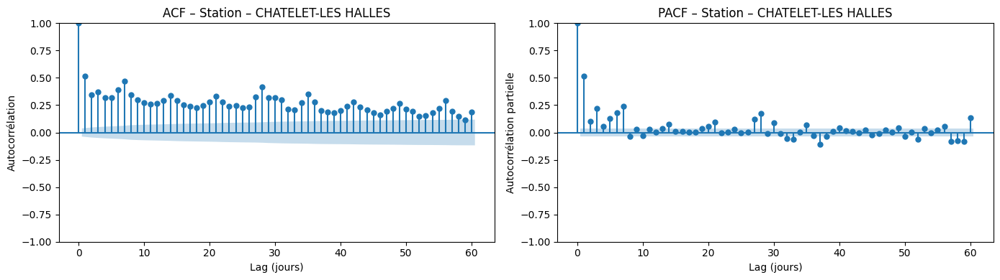

In [21]:
plot_acf_pacf_groups(
    df,
    stations=["GARE DE LYON", "CHATELET-LES HALLES"]
)

# Plot de l'ACF et PACF des series 

## 7. SkForecast 

In [22]:
from skforecast.recursive import ForecasterRecursiveMultiSeries
from skforecast.preprocessing import (
    RollingFeatures,
    reshape_series_long_to_dict,
    reshape_exog_long_to_dict
)

In [23]:
pd.set_option('display.max_columns', None)
df.head(2)

,DATE,LIBELLE_ARRET,VALD_TOTAL,ANNEE,MOIS,JOUR,is_holiday,holiday_name,is_school_holiday,is_weekend,is_winter,is_spring,is_summer,is_autumn,is_lockdown,weekend_school_holiday,weekend_holiday,dayofweek_sin,dayofweek_cos,month_sin,month_cos
0,2015-01-01,ABBESSES,731,2015,1,1,True,1er janvier,False,False,True,False,False,False,False,False,False,0.433884,-0.900969,0.5,0.866025
1,2015-01-01,ABLON,110,2015,1,1,True,1er janvier,False,False,True,False,False,False,False,False,False,0.433884,-0.900969,0.5,0.866025


In [24]:
boutique_col = "LIBELLE_ARRET"
min_observations = 1000
boutiques_counts = df [boutique_col].value_counts()
boutiques_valides = boutiques_counts [boutiques_counts >= min_observations].index.tolist()
print(f" {len (boutiques_valides)} boutiques avec ≥{min_observations} observations")

df = df [df [boutique_col].isin (boutiques_valides)]

 1131 boutiques avec ≥1000 observations


In [ ]:
df

,DATE,LIBELLE_ARRET,VALD_TOTAL,ANNEE,MOIS,JOUR,is_holiday,holiday_name,is_school_holiday,is_weekend,is_winter,is_spring,is_summer,is_autumn,is_lockdown,weekend_school_holiday,weekend_holiday,dayofweek_sin,dayofweek_cos,month_sin,month_cos
0,2015-01-01,ABBESSES,731,2015,1,1,True,1er janvier,False,False,True,False,False,False,False,False,False,0.433884,-0.900969,0.5,8.660254e-01
1,2015-01-01,ABLON,110,2015,1,1,True,1er janvier,False,False,True,False,False,False,False,False,False,0.433884,-0.900969,0.5,8.660254e-01
2,2015-01-01,ACHERES-GRAND-CORMIER,10,2015,1,1,True,1er janvier,False,False,True,False,False,False,False,False,False,0.433884,-0.900969,0.5,8.660254e-01
3,2015-01-01,ACHERES-VILLE,439,2015,1,1,True,1er janvier,False,False,True,False,False,False,False,False,False,0.433884,-0.900969,0.5,8.660254e-01
4,2015-01-01,AEROPORT CHARLES DE GAULLE 1,1257,2015,1,1,True,1er janvier,False,False,True,False,False,False,False,False,False,0.433884,-0.900969,0.5,8.660254e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2813837,2025-09-30,VOSVES,51,2025,9,30,False,NaN,False,False,False,False,False,True,False,False,False,0.781831,0.623490,-1.0,-1.836970e-16
2813838,2025-09-30,VULAINES SUR SE,81,2025,9,30,False,NaN,False,False,False,False,False,True,False,False,False,0.781831,0.623490,-1.0,-1.836970e-16
2813839,2025-09-30,WAGRAM,7597,2025,9,30,False,NaN,False,False,False,False,False,True,False,False,False,0.781831,0.623490,-1.0,-1.836970e-16
2813840,2025-09-30,YERRES,6752,2025,9,30,False,NaN,False,False,False,False,False,True,False,False,False,0.781831,0.623490,-1.0,-1.836970e-16


In [ ]:
df_copy = df.sort_values(by=['LIBELLE_ARRET', 'DATE']).copy()

series = df_copy[["LIBELLE_ARRET", "DATE", "VALD_TOTAL"]]
exog = df_copy.drop(columns=['VALD_TOTAL', "holiday_name"])

In [27]:
series

,LIBELLE_ARRET,DATE,VALD_TOTAL
0,ABBESSES,2015-01-01,731
718,ABBESSES,2015-01-02,1781
1439,ABBESSES,2015-01-03,1932
2157,ABBESSES,2015-01-04,3585
2879,ABBESSES,2015-01-05,2069
...,...,...,...
2810786,YVRIS NOISY GD,2025-09-26,1046
2811544,YVRIS NOISY GD,2025-09-27,501
2812299,YVRIS NOISY GD,2025-09-28,417
2813070,YVRIS NOISY GD,2025-09-29,1285


In [31]:
# Transform series and exog to dictionaries
# ==============================================================================
series_dict = reshape_series_long_to_dict(
    data      = series,
    series_id = 'LIBELLE_ARRET',
    index     = 'DATE',
    values    = 'VALD_TOTAL',
    freq      = 'D'
)

exog_dict = reshape_exog_long_to_dict(
    data      = exog,
    series_id = 'LIBELLE_ARRET',
    index     = 'DATE',
    freq      = 'D'
)

In [ ]:
series_dict

{'ABBESSES': 2015-01-01     750
 2015-01-02    1781
 2015-01-03    1932
 2015-01-04    3585
 2015-01-05    2069
 Freq: D, Name: ABBESSES, dtype: int32}

In [32]:
exog_dict

{'ABBESSES':              ANNEE  MOIS  JOUR is_holiday holiday_name is_school_holiday  \
 2015-01-01  2015.0   1.0   1.0       True  1er janvier             False   
 2015-01-02  2015.0   1.0   2.0      False          NaN             False   
 2015-01-03  2015.0   1.0   3.0      False          NaN             False   
 2015-01-04  2015.0   1.0   4.0      False          NaN             False   
 2015-01-05  2015.0   1.0   5.0      False          NaN             False   
 ...            ...   ...   ...        ...          ...               ...   
 2025-09-26  2025.0   9.0  26.0      False          NaN             False   
 2025-09-27  2025.0   9.0  27.0      False          NaN             False   
 2025-09-28  2025.0   9.0  28.0      False          NaN             False   
 2025-09-29  2025.0   9.0  29.0      False          NaN             False   
 2025-09-30  2025.0   9.0  30.0      False          NaN             False   
 
            is_weekend is_winter is_spring is_summer is_autumn

In [34]:
end_train = "2025-09-01"
series_dict_train = {k: v. loc[:end_train,] for k, v in series_dict.items()}
exog_dict_train = {k: v.loc[: end_train,] for k, v in exog_dict.items()}
exog_dict_test = {k: v.loc[end_train:,] for k, v in exog_dict.items()}

In [39]:
# Fit forecaster
# ==============================================================================
estimator = RandomForestRegressor(
    n_estimators=800, 
    max_depth=10, 
    min_samples_split=10, 
    min_samples_leaf=5, 
    max_features=0.5, 
    random_state=42, 
    bootstrap=True,  
    n_jobs=-1
    )



window_features =RollingFeatures(
    stats=['mean', 'mean', "mean", "std", "std"], 
    window_sizes=[3, 7, 14, 7, 14]
    )




forecaster = ForecasterRecursiveMultiSeries(
                estimator          = estimator,
                lags               = [1,2, 3, 4,7, 14,21, 28, 30, 35, 58, 63, 364],
                window_features    = window_features,
                encoding           = "onehot",
                dropna_from_series = True
            )

forecaster.fit(series=series_dict, exog=exog_dict, suppress_warnings=True)
forecaster

ValueError: could not convert string to float: '1er janvier'

In [ ]:
predictions = forecaster.predict(steps= 104, exog=test_dict, suppress_warnings=True)

df_pred = predictions.reset_index()
df_pred.columns = ["date", "region_code", "TauxGrippe_pred"]

df_test_pred = pd.merge(
    test,          # Test original avec Id
    df_pred,
    on=["region_code", "date"],
    how="left"
)

submission = df_test_pred[['Id', 'TauxGrippe_pred']]
submission.rename(columns={"TauxGrippe_pred": "TauxGrippe"}, inplace=True)
submission.to_csv("submission.csv", index=False)

In [ ]:
===============================================

SyntaxError: invalid syntax (3758341841.py, line 1)

In [ ]:
gs = GeneralPresentator(df)

gs.print_basic_prez()


NameError: name 'GeneralPresentator' is not defined

---

## 3. Exploration du jeu de données (Analyse descriptive, statistiques descriptives, visualisation)

Il peut s'avérer très utile d'effectuer une analyse exploratoire de données pour comprendre les tendances globales de la consommation d'énergie, telles que les fluctuations saisonnières, les variations entre les jours de la semaine et les week-ends, et les comportements de consommation à long terme. Cette analyse peut être effectuée à différentes échelles de temps, allant de l'heure près, au quotidien, à l'hebdomadaire ou encore au mensuel, en fonction de la résolution temporelle des données disponibles et des objectifs de l'analyse.

En comprenant les tendances globales, les schémas saisonniers et les comportements de consommation, il est possible de mieux anticiper la demande future d'énergie et d'adapter la production d'énergie en conséquence. Cette compréhension peut également aider à informer les politiques énergétiques et les pratiques de tarification qui encouragent les comportements de consommation éco-responsables.


In [ ]:
dataplots = DataPlotter(df)


> Pandas Profiling


En regardant le pandas profiling nous pouvons voir:

- *Données dupliquées* : il s'agit des zéros, ils sont considérés comme dupliqués mais l'index n'est cependant pas le même, cela ne suppose donc pas un problème. 
- *Zéros* : il s'agit de problèmes de production dans le système éléctrique. 
- *Variables qui sont fortement corrélées* : par la suite pour la construction du modèle nous avons construit une fonction de séléction de variables qui prend en compte la corrélation à la cible et la corrélation entre variables en gardant que les variables qui sont le plus corrélés à la target et en évitant la corrélation entre elles.

**Distribution des variables:**
Nous pouvons voir que les distributions ont en générale une skewness positive. Cela est tout à fait normal, il y a quelques jours ou la consommation éléctrique peut-être très très élevé surtout en hiver où on reste plus à la maison, on chauffe la maison, on cuisine et on fait des machines. Les jours très froids même si rares à Scéaux ils sont quand même présent quelques fois par an. Ces consommation sont les consommation vraiment à l'extrême de la distribution. mais en général, la consommation est plus modérée. 

La distribution avec une skewness positive est donc normal et présente dans les variables: 
- `global_active_power`
- `global_reactive_power`
- `global_intensity`
- `global_active_power`
- `other_submetering`

Une distribution normale est présente pour le `voltage`, c'est normal par construction (grandeur physique). 

Des distributions particulières:
- `Sub_metering_3`: consommation ou très forte ou très faible, essentiellement le chauffage et donc corrélé à la temperature et en moins mesure à la saison.
- `Sub_metering_2`: Très proche du nul, en effet, la buanderie ne constitue pas une dépense énergetique majeur et est constant au cours des saisons et du temps. On peut prévoir que cette variable constante n'impactera donc pas le modèle dans une grande mesure. Comme nous verrons par la suite, c'est une consommation speciallement présente les week-end et donc l'impact de cette consommation sera probablement pris par la variable week-end que nous allons créer.
- `Sub_metering_1`: Une consommation faible mais très présente, quasiement tous les jours. Une consommation très forte mais pas très présente. Par exemple, les familles qui préparent les repas de la semaine les week-end.

**Interactions entre variables:**  
Spécialement la cible ne présente pas des rélations non-linéaires. Nous pouvons anticiper une bonne précision des modèles naïfs par la suite. Encore une fois, c'est normal puisque toutes les variables sont à une transformation prêt de la cible. 

**Corrélations:**
Sauf le voltage qui est constant au fil du temps, les reste des variables sont assez corrélées. 

In [ ]:
dataplots.data_profiling(granularity="H")


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

> Calendar overview

In [ ]:
tree_df = df.assign(day=df['Date'].dt.day,
                                 month=df['Date'].dt.month,
                                 year=df['Date'].dt.year)

In [ ]:
# create the treemap
fig = px.treemap(tree_df, path=["year", "month", "day"], values="Global_active_power")

# show the plot
fig.show()


> Calendar plots

Lorsqu'on étudie la consommation électrique totale, il est évident qu'elle est fortement influencée par les saisons. En effet, durant l'hiver, la demande en énergie augmente considérablement en raison du chauffage, car il s'agit d'une ville plutôt froide. En revanche, pendant l'été et les périodes de vacances, la demande diminue. Malgré ces variations saisonnières importantes, la consommation électrique reste globalement stable d'une année sur l'autre, bien que l'on remarque une légère hausse de la demande les week-ends.

Il convient également de souligner que le chauffage représente la majeure partie de la consommation électrique. Cette observation souligne l'importance de comprendre l'impact des conditions météorologiques sur la demande d'énergie et les stratégies d'efficacité énergétique qui pourraient être mises en place pour réduire la consommation d'énergie liée au chauffage.

(<Figure size 2400x1500 with 5 Axes>,
 array([<AxesSubplot: ylabel='2006'>, <AxesSubplot: ylabel='2007'>,
        <AxesSubplot: ylabel='2008'>, <AxesSubplot: ylabel='2009'>,
        <AxesSubplot: ylabel='2010'>], dtype=object))

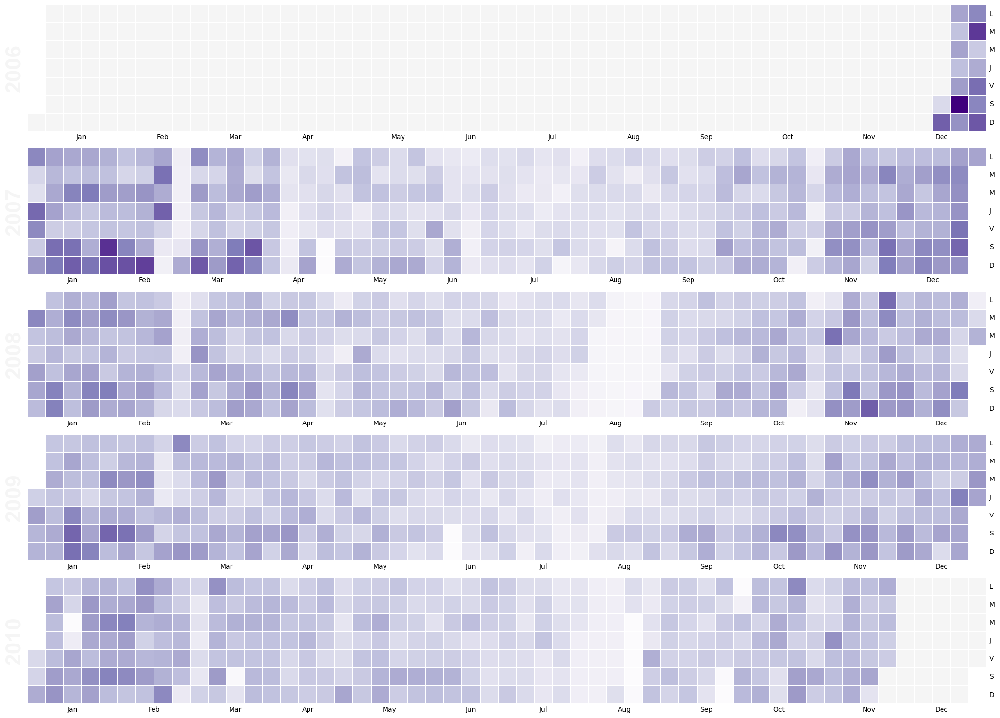

In [ ]:
calmap.calendarplot(df[TARGET], monthticks=3, daylabels='LMMJVSD', cmap='Purples',
                    linewidth=0.2, fig_kws=dict(figsize=(24, 15)))


En examinant de plus près le sous-comptage de l'électricité dans la cuisine, nous pouvons observer une tendance intéressante : une augmentation de la consommation électrique les week-ends, tandis que celle-ci diminue pendant les vacances et l'été. Cependant, il y a certains jours où la consommation d'énergie augmente sensiblement, et nous pouvons supposer qu'il s'agit des jours fériés.

Cette observation suggère que les habitudes de consommation électrique dans la cuisine sont influencées par les rythmes de vie des occupants de la maison, avec une augmentation de la demande d'électricité pendant les week-ends lorsque les gens ont plus de temps libre et passent plus de temps chez eux. L'impact des jours fériés sur la consommation d'électricité dans la cuisine peut également être lié aux habitudes alimentaires et aux activités de loisirs spécifiques à ces occasions. Ces résultats soulignent l'importance de comprendre les facteurs qui influencent la demande d'énergie et de développer des stratégies pour encourager des comportements de consommation plus durables.

(<Figure size 2400x1500 with 5 Axes>,
 array([<AxesSubplot: ylabel='2006'>, <AxesSubplot: ylabel='2007'>,
        <AxesSubplot: ylabel='2008'>, <AxesSubplot: ylabel='2009'>,
        <AxesSubplot: ylabel='2010'>], dtype=object))

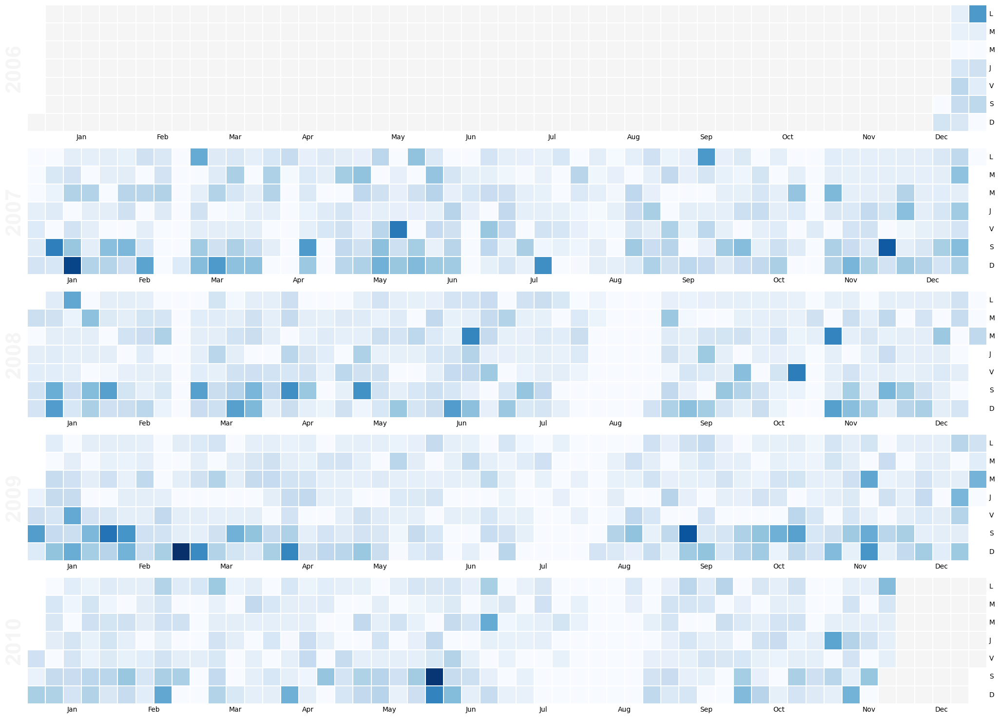

In [ ]:
calmap.calendarplot(df['Sub_metering_1'], monthticks=3, daylabels='LMMJVSD', cmap='Blues',
                    linewidth=0.2, fig_kws=dict(figsize=(24, 15)))


L'analyse du sous-comptage de l'électricité dans la buanderie révèle une tendance marquée : une consommation électrique plus élevée les mercredis, suivie dans une moindre mesure par les mardis, et une augmentation significative le week-end.

Ces résultats semblent cohérents avec le comportement général de la population, qui pourrait consacrer les mercredis à la lessive et au ménage, et accorder davantage de temps libre aux activités domestiques le week-end. 

(<Figure size 2400x1500 with 5 Axes>,
 array([<AxesSubplot: ylabel='2006'>, <AxesSubplot: ylabel='2007'>,
        <AxesSubplot: ylabel='2008'>, <AxesSubplot: ylabel='2009'>,
        <AxesSubplot: ylabel='2010'>], dtype=object))

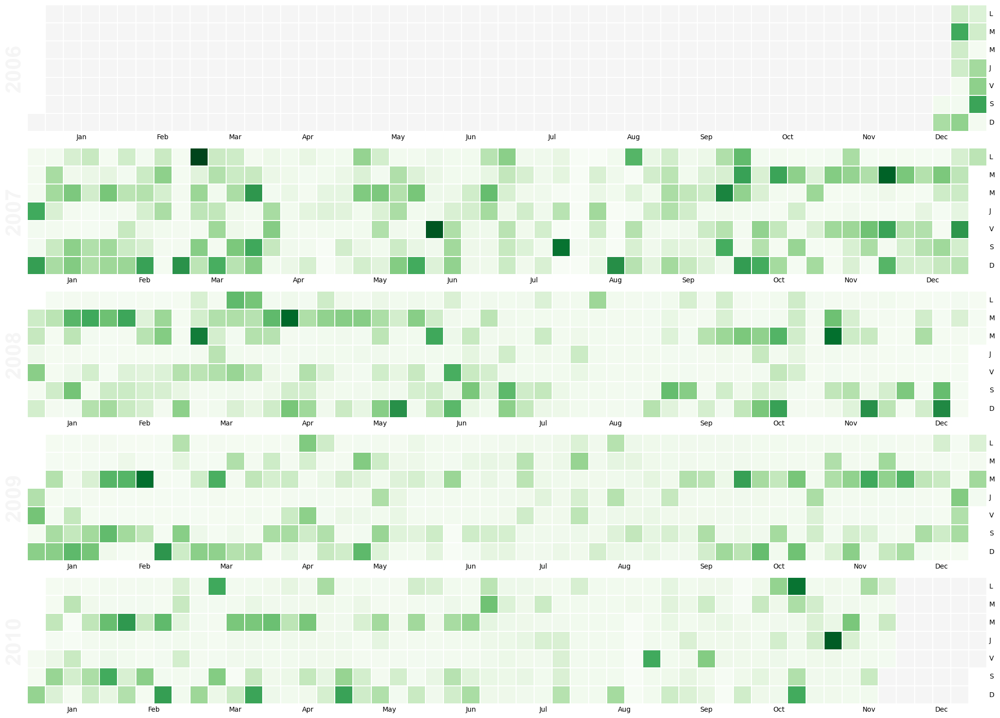

In [ ]:
calmap.calendarplot(df['Sub_metering_2'], monthticks=3, daylabels='LMMJVSD', cmap='Greens',
                    linewidth=0.2, fig_kws=dict(figsize=(24, 15)))


L'analyse du sous-comptage d'électricité dans le troisième sous-compteur suggère que la ville est particulièrement froide, avec une forte consommation d'électricité en hiver et pendant les jours froids. Cette saisonnalité peut nous aider à anticiper la consommation d'énergie des ménages dans les prochains jours.

Cependant, l'absence de consommation en été indique également que la ville n'a pas besoin de climatisation pendant cette période. La prise en compte de ces tendances saisonnières est essentielle pour comprendre les habitudes de consommation d'énergie et concevoir des stratégies efficaces de gestion de la demande.

Malheureusement, nous n'avons pas pu intégrer les données de prévision météorologique pour Scéaux en 2006 avec une granularité horaire pour la température. Cependant, l'introduction de ces données pourrait être très intéressante pour affiner les prévisions de consommation d'énergie et améliorer les stratégies d'efficacité énergétique à l'avenir.

(<Figure size 2400x1500 with 5 Axes>,
 array([<AxesSubplot: ylabel='2006'>, <AxesSubplot: ylabel='2007'>,
        <AxesSubplot: ylabel='2008'>, <AxesSubplot: ylabel='2009'>,
        <AxesSubplot: ylabel='2010'>], dtype=object))

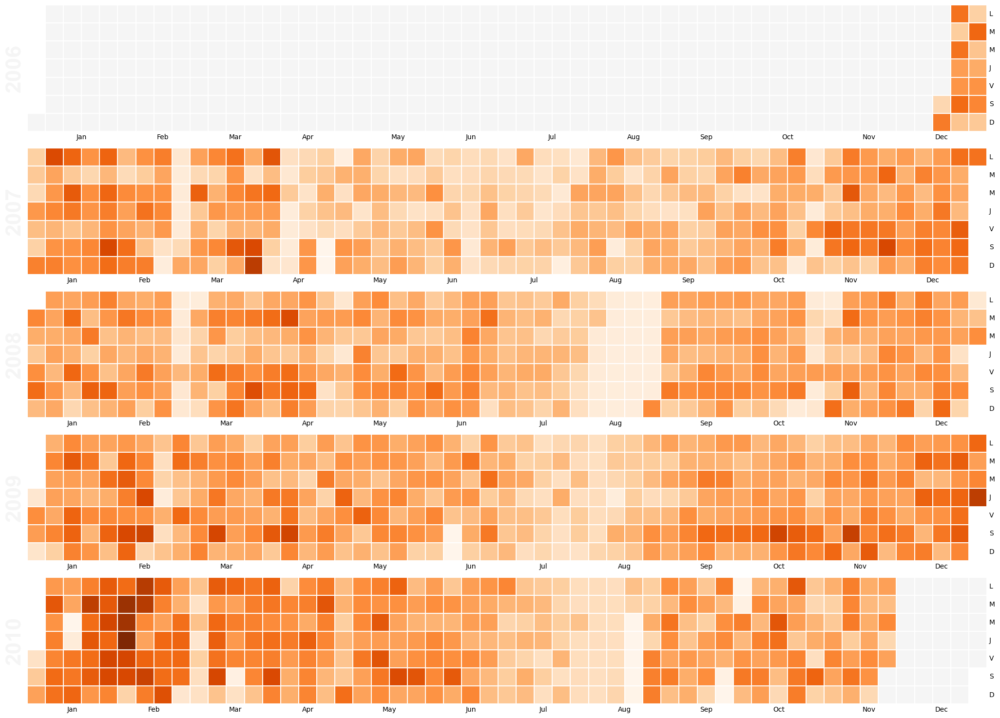

In [ ]:
calmap.calendarplot(df['Sub_metering_3'], monthticks=3, daylabels='LMMJVSD', cmap='Oranges',
                    linewidth=0.2, fig_kws=dict(figsize=(24, 15)))


L'examen des données révèle une constance de la consommation d'électricité, avec une faible saisonnalité en été et l'absence de saisonnalité à une granularité journalière.

Cela suggère que les habitudes de consommation d'énergie des occupants de la maison restent relativement stables tout au long de l'année et que les variations saisonnières observées sont principalement liées à des facteurs extérieurs, tels que la météo et les jours fériés.



(<Figure size 2400x1500 with 5 Axes>,
 array([<AxesSubplot: ylabel='2006'>, <AxesSubplot: ylabel='2007'>,
        <AxesSubplot: ylabel='2008'>, <AxesSubplot: ylabel='2009'>,
        <AxesSubplot: ylabel='2010'>], dtype=object))

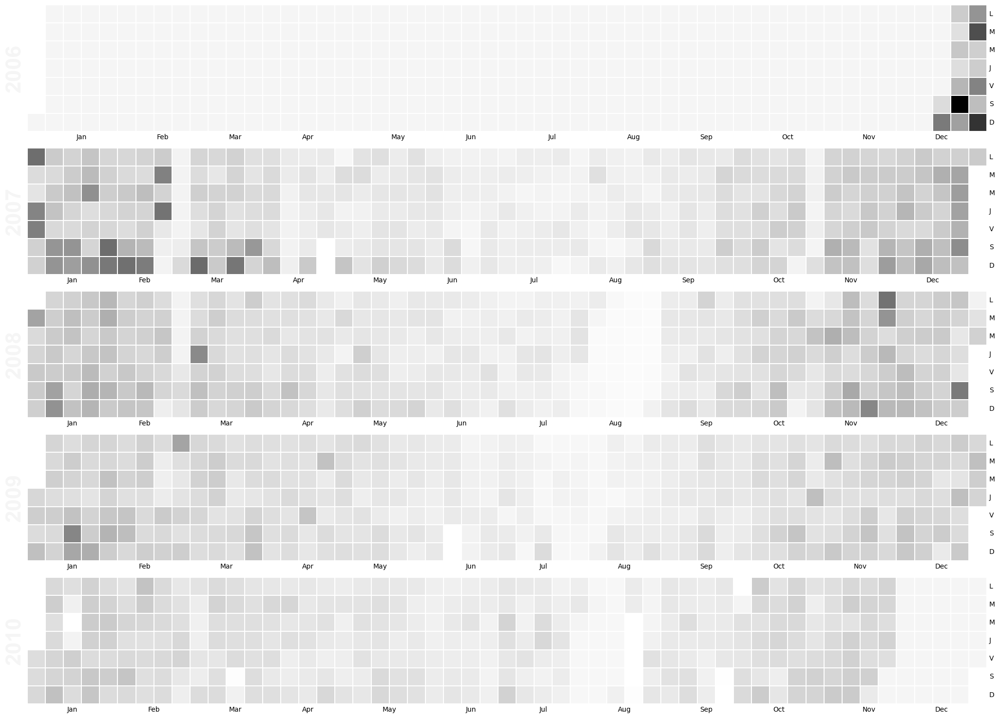

In [ ]:
calmap.calendarplot(df['other_submetering'], monthticks=3, daylabels='LMMJVSD', cmap='Greys',
                    linewidth=0.2, fig_kws=dict(figsize=(24, 15)))


### 3.3 Visualisation des time series

L'examen de la consommation d'électricité sur une base trimestrielle avec une granularité grossière révèle que bien que la demande électrique globale soit très saisonnière, la consommation électrique de la cuisine et de la buanderie ne le sont pas. Cependant, si nous examinons les données à une granularité plus fine, c'est-à-dire par heure, toutes les consommations présentent une certaine saisonnalité.

Ces variations saisonnières pourront être prises en compte dans un futur modèle de prédiction en ajoutant des variables saisonnières telles qu'une variable binaire pour l'été ou l'hiver. L'idée est que ces variables auront un poids dans le modèle pour nous permettre d'anticiper la consommation future. Cette observation suggère également que l'utilisation d'un modèle naïf saisonnier pourrait être très performant dans notre cas, en raison de la forte saisonnalité des données.

La prise en compte de ces variations saisonnières dans les modèles de prédiction de la consommation d'énergie peut aider à améliorer l'efficacité énergétique et à réduire les coûts en anticipant les périodes de demande élevée et en adaptant la production et la distribution d'énergie en conséquence.







In [ ]:
# Suppression de la feature voltage et year pour observer les autres features
cols = list(df.columns)
viz_cols = [i for i in cols if i not in [
    'Date', 'Time', 'Voltage', 'year', 'day', 'month']]


> Plotting des times series

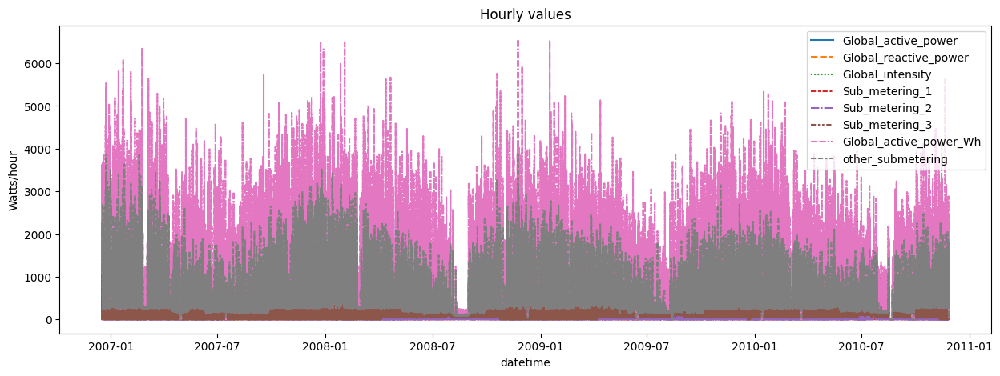

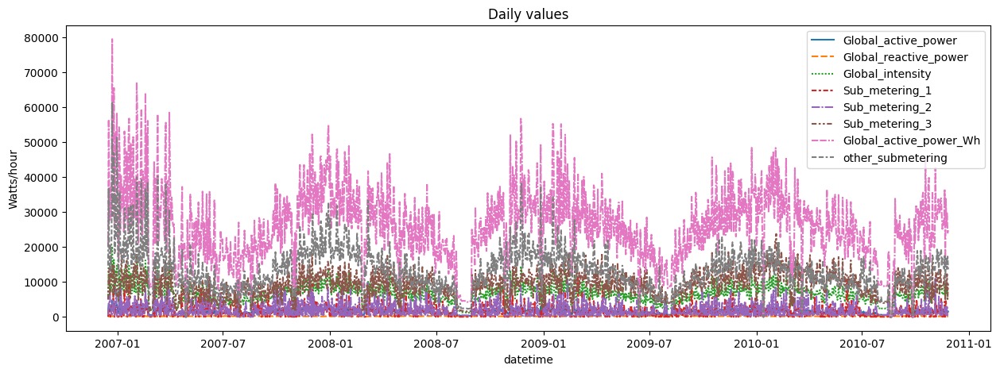

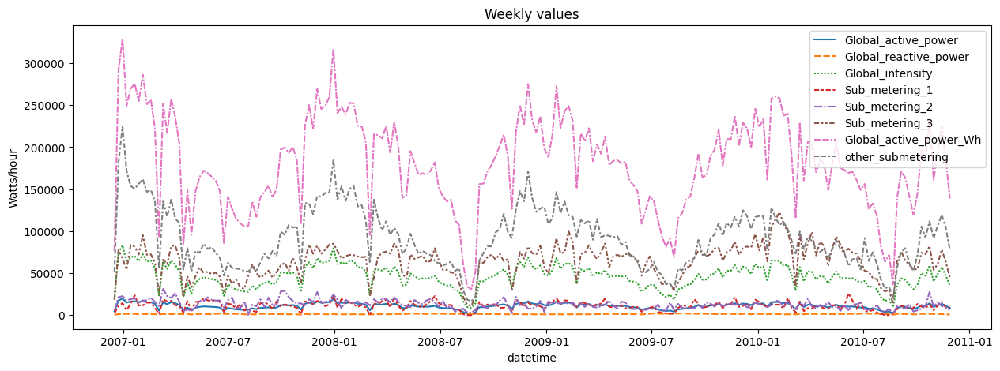

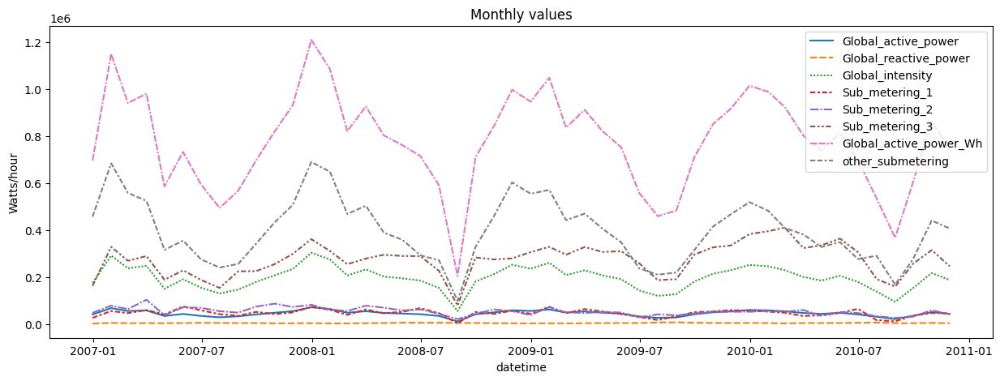

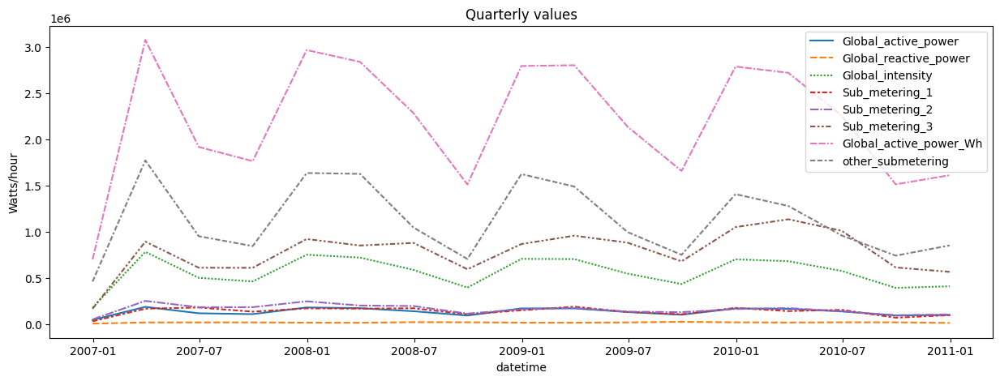

In [ ]:
dataplots.plot_time_series(column=viz_cols, granularity="all")


> Distribution plots

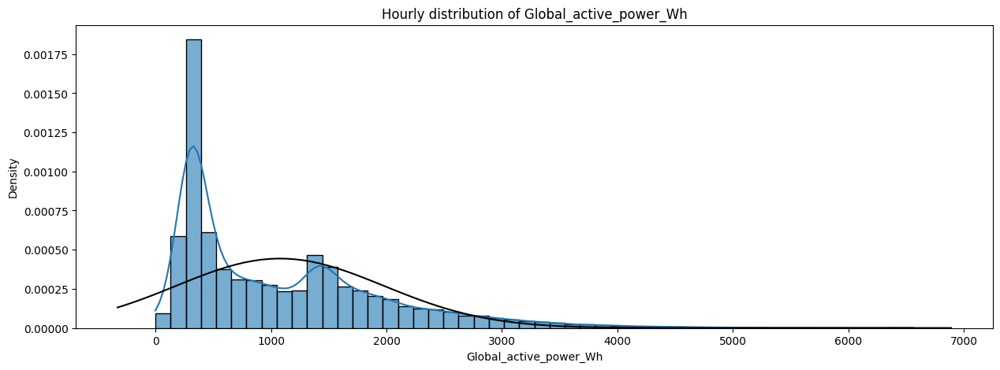

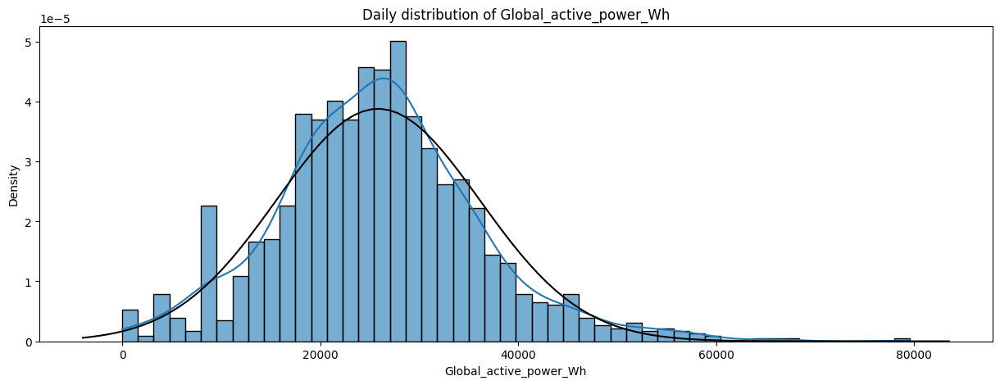

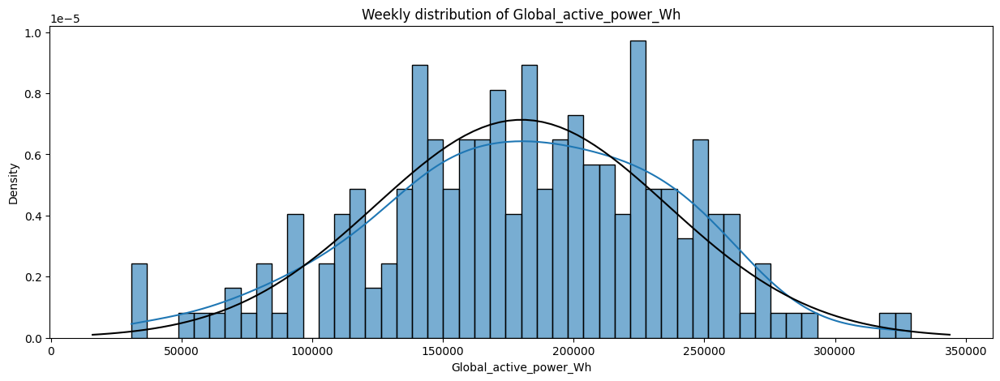

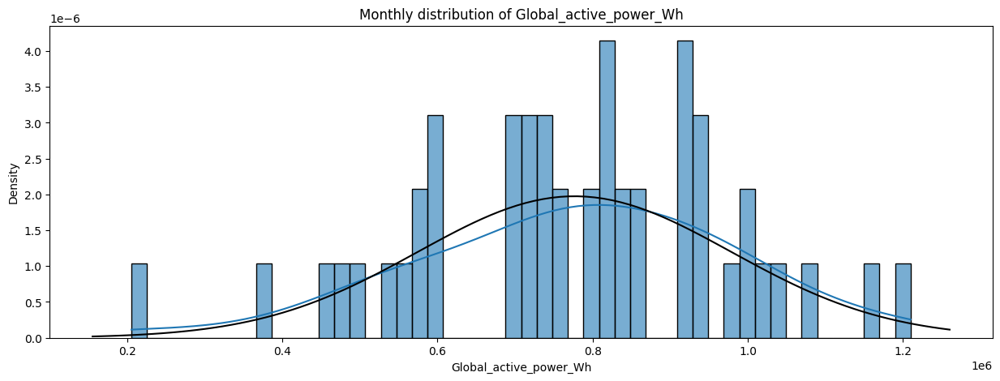

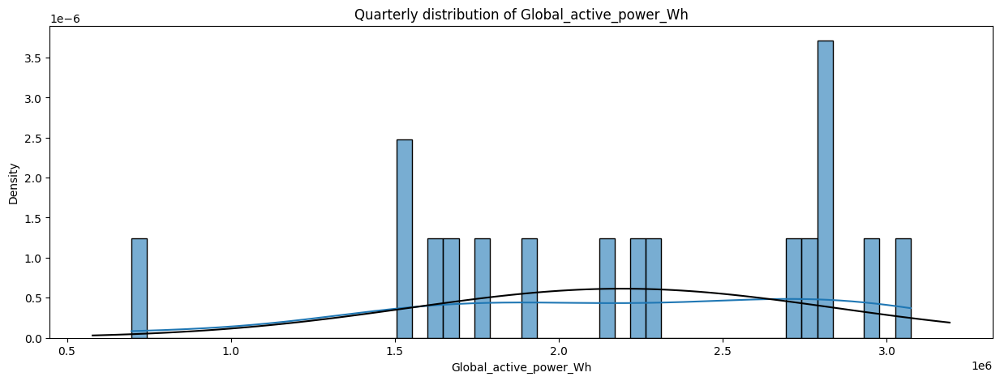

In [ ]:
# Observation de la distribution de la puissance par rapport à une distribution Gaussienne
dataplots.plot_histogram(TARGET, granularity="all")


>  Pairplots

Nous avons confirmé les résultats de l'analyse avec pandas profiling, qui montre une linéarité entre la variable cible et les variables explicatives.

Cette observation est importante car elle suggère que les variables explicatives sont significatives pour la prédiction de la consommation d'énergie et que nous pouvons utiliser des modèles de régression linéaire pour établir des prévisions fiables. Toutefois, il est important de noter que d'autres modèles, tels que les modèles non linéaires ou basés sur des arbres de décision, pourraient également être adaptés à notre jeu de données en fonction des caractéristiques spécifiques des données et des objectifs de prédiction.

In [ ]:
# sns.pairplot(df[['Global_active_power', 'Global_reactive_power',
#              'Voltage', 'Global_intensity', 'Sub_metering_2', 'Sub_metering_3']])


> Probability plots

L'examen des plots de probabilités révèle l'absence de valeurs négatives, mais une sur-représentation de valeurs nulles qui contribuent à une queue de distribution plus importante. Cette distribution est fortement influencée par les contraintes du réseau électrique, ce qui peut expliquer cette tendance.

De plus, nous constatons une forte asymétrie avec des valeurs extrêmement élevées, qui correspondent probablement à des périodes de forte demande en énergie causées par des conditions météorologiques extrêmes, telles que des journées très froides.



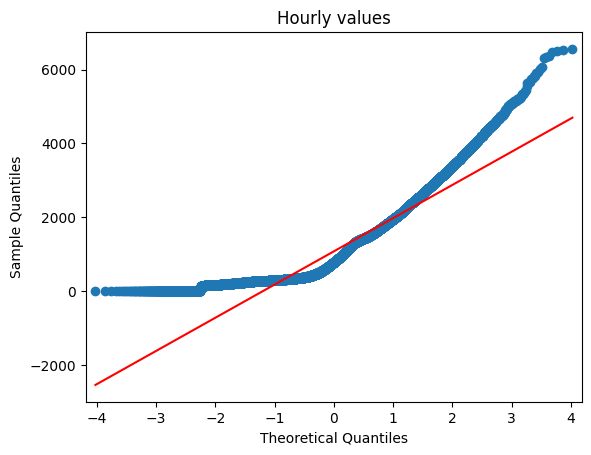

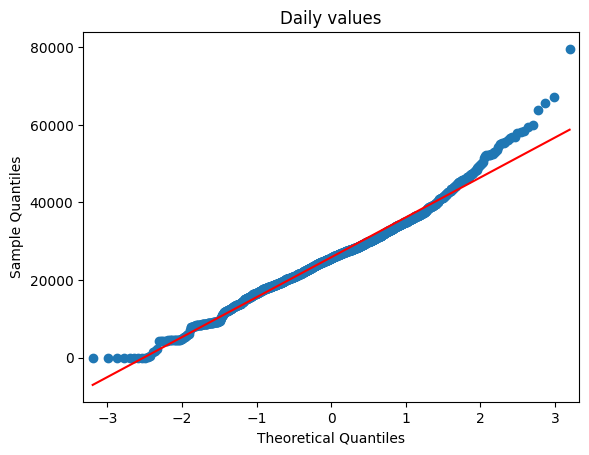

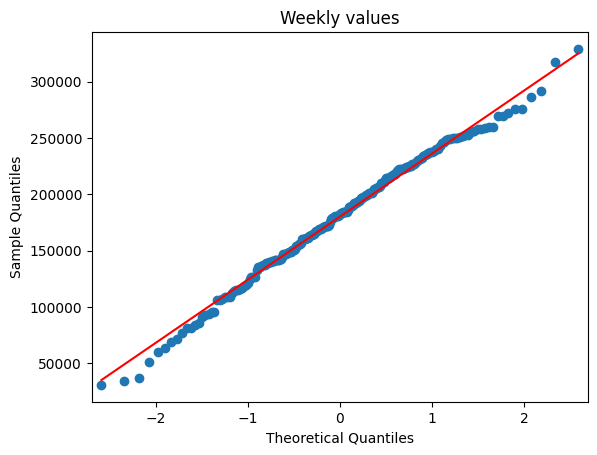

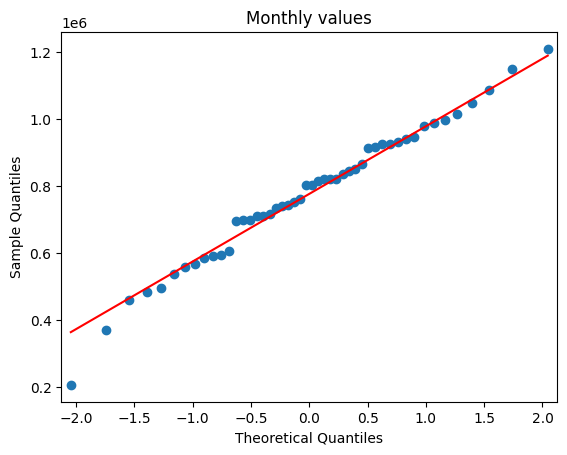

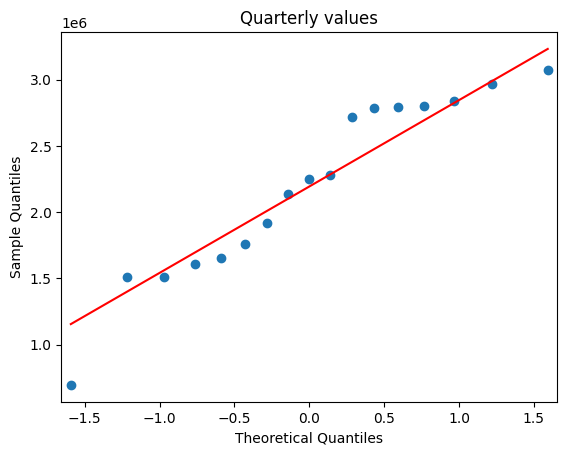

In [ ]:
# Add probability plot for the column
dataplots.plot_prob(column=TARGET)


> Pattern analysis

En examinant les données à différentes granularités, nous pouvons constater que plus nous sommes précis dans la mesure de la consommation d'énergie, plus la série devient bruyante. Cette observation est en grande partie due à nos habitudes quotidiennes, telles que les cycles jour/nuit et les périodes d'activité et de repos, qui influencent la demande en énergie.

De plus, nous pouvons également observer des cycles plus longs qui se répètent, tels que les différences entre les jours de la semaine et les week-ends, ou les saisons d'hiver et d'été. Cette saisonnalité peut être particulièrement importante pour prévoir la demande future d'énergie et ajuster les stratégies de production et de distribution d'énergie en conséquence.

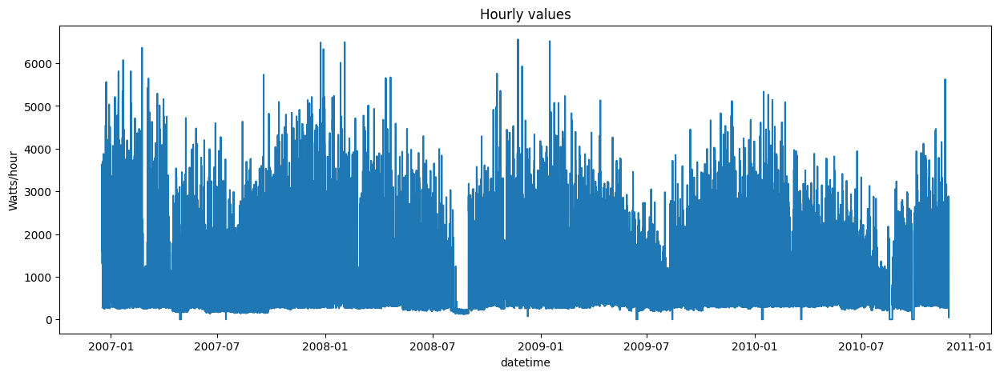

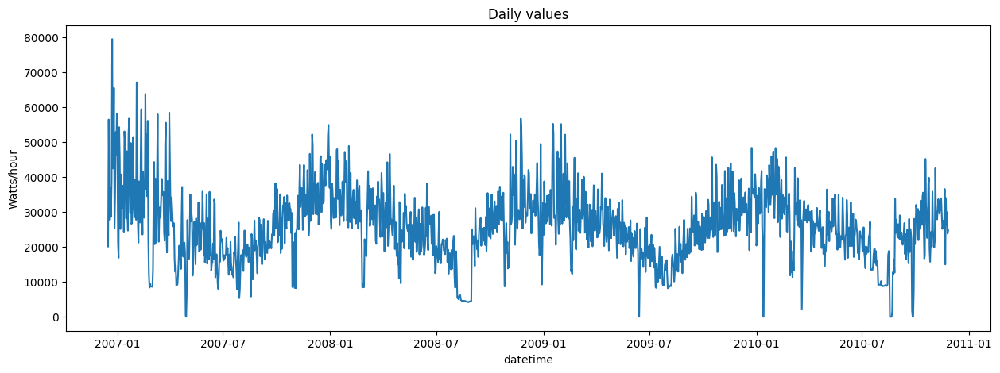

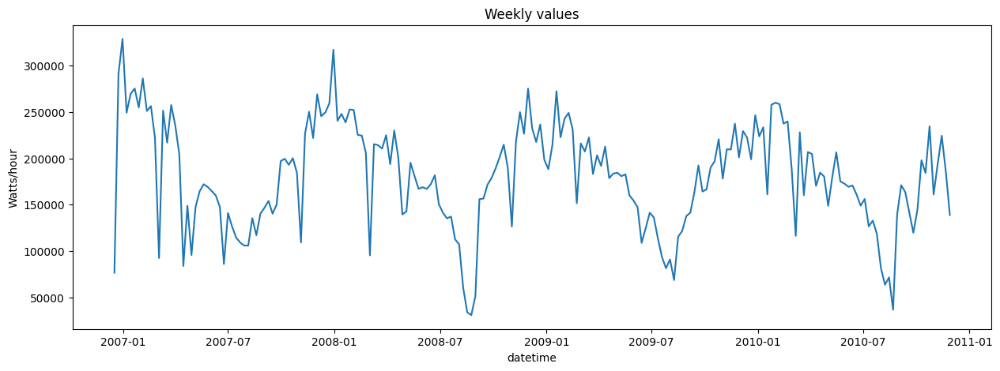

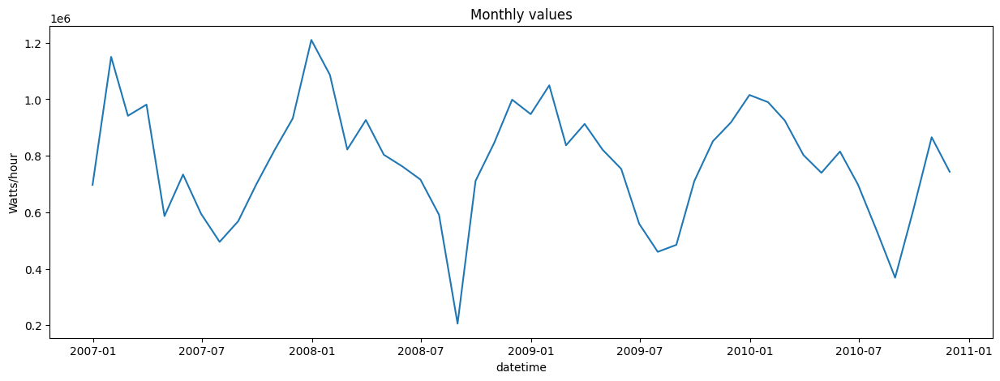

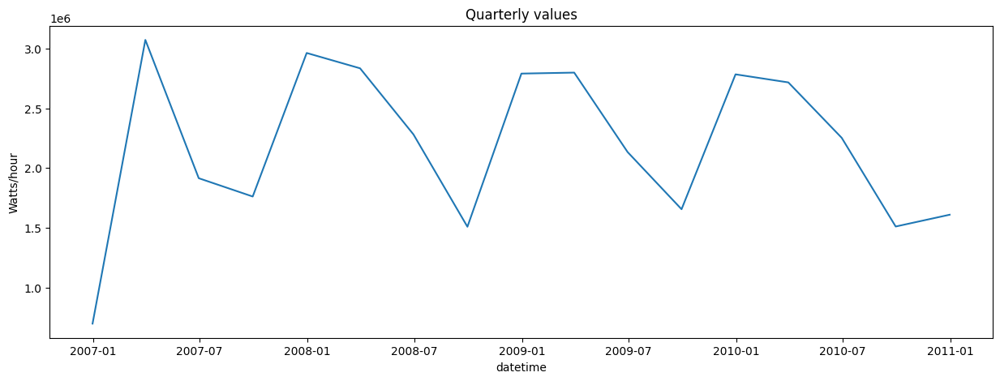

In [ ]:
dataplots.plot_time_series(column=TARGET, granularity="all")


>  Breaking down the time variables to see patterns

Nous disposons d'une décomposition de la variable cible qui sera utilisée pour prédire la consommation d'énergie future. Cependant, il est important d'analyser toutes les variables disponibles pour déterminer les variables explicatives à utiliser dans la prédiction.

L'analyse de ces variables peut nous aider à comprendre les facteurs qui influencent la demande d'énergie et à identifier les variables les plus significatives pour la prédiction de la consommation d'énergie future.

In [ ]:
analyzer = PatternAnalyzer(df)
sub_metering = ['Sub_metering_1', 'Sub_metering_2',
                'Sub_metering_3']


L'examen des plots révèle une forte saisonnalité, avec une demande d'énergie plus élevée en hiver et une demande plus faible en été. Cette tendance peut être attribuée à l'utilisation du chauffage en hiver, qui représente une grande partie de la consommation d'énergie dans les foyers.

En outre, nous constatons également des creux de consommation d'énergie pendant les vacances d'hiver et les vacances d'octobre/novembre. Cette observation suggère que les habitudes de consommation d'énergie des occupants de la maison varient en fonction des vacances scolaires et des périodes de congé, ce qui pourrait avoir un impact sur les prévisions de la demande d'énergie.



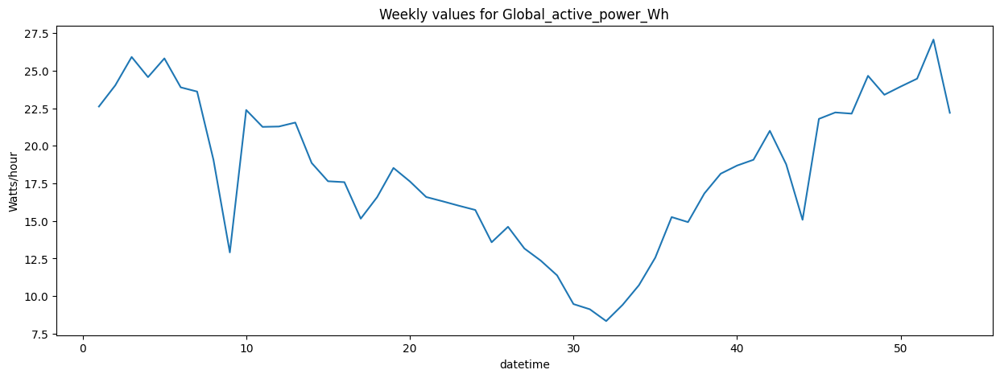

In [ ]:
analyzer.plot_time_series(TARGET, "W")


Nous observons un pattern similaire pour les autres variables de consommation, en particulier pour le chauffage, qui représente la plus grande partie de la consommation d'énergie dans les foyers. Nous constatons également une stabilité relative de la consommation d'énergie pour la buanderie et la cuisine au fil du temps.

En outre, la stabilité relative de la consommation d'énergie pour la buanderie et la cuisine suggère que ces variables pourraient être moins influencées par les facteurs externes et les événements spécifiques que les autres variables de consommation. Cette observation peut avoir des implications pour le développement de stratégies d'efficacité énergétique ciblées sur ces zones spécifiques de la maison.

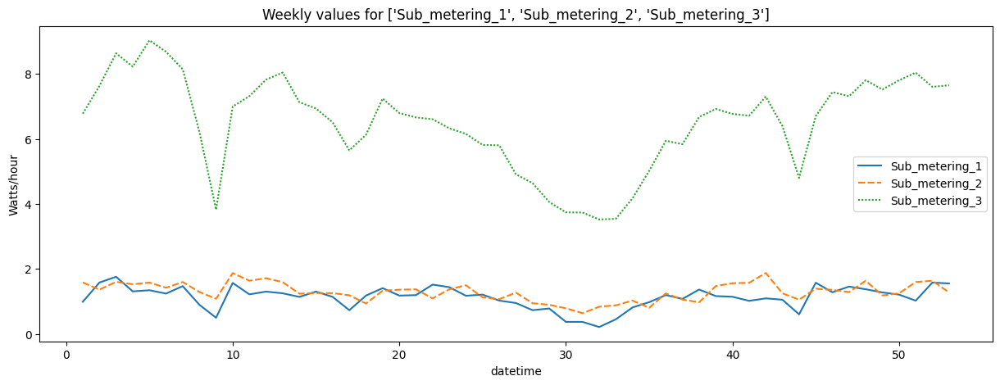

In [ ]:
analyzer.plot_time_series(sub_metering, "W")


## 4. Data cleaning et imputation de données manquantes

In [ ]:
# Nous avons des nan dans toutes les colonnes sauf la date
df.isna().any()


Date                      False
Time                      False
Global_active_power        True
Global_reactive_power      True
Voltage                    True
Global_intensity           True
Sub_metering_1             True
Sub_metering_2             True
Sub_metering_3             True
Global_active_power_Wh     True
other_submetering          True
dtype: bool

In [ ]:
# On vérifie si c'est bien toute la ligne qui est nan et c'est bien le cas.
mask = df['Global_active_power_Wh'].isna()
df.loc[~mask].isna().any()


Date                      False
Time                      False
Global_active_power       False
Global_reactive_power     False
Voltage                   False
Global_intensity          False
Sub_metering_1            False
Sub_metering_2            False
Sub_metering_3            False
Global_active_power_Wh    False
other_submetering         False
dtype: bool

In [ ]:
print("Comptage des NaN par colonne:")
print(df.isna().sum())

# Si bien cela peut paraître beaucoup, cela ne réprésente que 1,25% des observations.


Comptage des NaN par colonne:
Date                          0
Time                          0
Global_active_power       25979
Global_reactive_power     25979
Voltage                   25979
Global_intensity          25979
Sub_metering_1            25979
Sub_metering_2            25979
Sub_metering_3            25979
Global_active_power_Wh    25979
other_submetering         25979
dtype: int64


In [ ]:
print(
    f'Nombre de jours qui présentent des NaN: {df[df["Global_active_power_Wh"].isna()]["Date"].nunique()}')


Nombre de jours qui présentent des NaN: 82


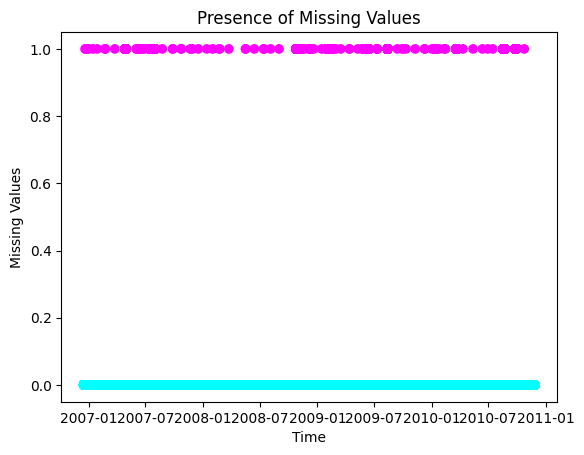

In [ ]:
import matplotlib.pyplot as plt

df['missing'] = 0

mask = df['Global_active_power_Wh'].isna()
df.loc[mask, 'missing'] = 1

# Create a scatter plot with color-coded markers
plt.scatter(df.index, df['missing'], c=df['missing'], cmap='cool', marker='o')

# Set the axis labels and title
plt.xlabel('Time')
plt.ylabel('Missing Values')
plt.title('Presence of Missing Values')

# Show the plot
plt.show()


La distribution est normale, des NaN sont présent dans tous les dates. En conséquence, il est justifié de drop les valeurs manquantes.  

Une solution alternatice serait de réaliser un forward fill (ou un back fill), mais on préfère le premier car si on voulait prédire d'un jour à l'autre, on n'aurait pas l'information du lendemain et donc le back fill serait pas possible.  

Cependant, en vue que les NaN représentent des failles dans le système, nous allons drop les nan. Pourquoi ? Ils sont souvent présent dans plusieurs observations de suite et remplacer par une valeur constante n'est donc pas pertinent. Une méthode plus sophistiquée pourrait être mise en place tel que un ARIMA mais on considère cela inutile dans notre cas où on à 1% de valeur manquantes avec autant d'observations et le remplacement n'impacte pas les métriques du modèle. 

In [ ]:
df.dropna(inplace=True)


---

## 5. Feature engineering

Nous avons dû apporter quelques modifications préliminaires telles que le downcasting, la création de variables ou le changement d'unités, qui auraient dû figurer dans cette partie, mais par souci de commodité, nous les avons décalées. De plus, nous avons créé certaines fonctionnalités telles que "is_winter" et "is_summer" (des variables saisonnières) afin de tenir compte des saisons dans le modèle et d'expliquer les baisses. Nous avons également ajouté des variables telles que "week-end" et "jours fériés" en France, sur la même logique.

Pour la création de lags, nous avons développé une petite fonction intégrée à la classe qui permet de choisir le lag souhaité et l'unité associée (par exemple, lag = [1,2,3,4], où les nombres peuvent représenter des jours, des heures ou des minutes). Nous avons cherché à généraliser autant que possible ces fonctions.

Il ne faut pas non plus oublier les variables spécifiques aux séries temporelles telles que les fenêtres glissantes et la conversion de l'heure en sinus afin de prendre en compte le caractère circulaire de l'heure.

In [ ]:
fe = FeatureEngineer(df, TARGET)
df = df.drop(columns=["Date", "Time"])
df = fe.create_variables(lag=[1, 2, 3, 4], time="day", window_size=30)


In [ ]:
df.columns


Index(['Date', 'Time', 'Global_active_power_Wh', 'missing', 'Date_lag1d',
       'Date_lag2d', 'Date_lag3d', 'Date_lag4d', 'Time_lag1d', 'Time_lag2d',
       'Time_lag3d', 'Time_lag4d', 'Global_active_power_lag1d',
       'Global_active_power_lag2d', 'Global_active_power_lag3d',
       'Global_active_power_lag4d', 'Global_reactive_power_lag1d',
       'Global_reactive_power_lag2d', 'Global_reactive_power_lag3d',
       'Global_reactive_power_lag4d', 'Voltage_lag1d', 'Voltage_lag2d',
       'Voltage_lag3d', 'Voltage_lag4d', 'Global_intensity_lag1d',
       'Global_intensity_lag2d', 'Global_intensity_lag3d',
       'Global_intensity_lag4d', 'Sub_metering_1_lag1d',
       'Sub_metering_1_lag2d', 'Sub_metering_1_lag3d', 'Sub_metering_1_lag4d',
       'Sub_metering_2_lag1d', 'Sub_metering_2_lag2d', 'Sub_metering_2_lag3d',
       'Sub_metering_2_lag4d', 'Sub_metering_3_lag1d', 'Sub_metering_3_lag2d',
       'Sub_metering_3_lag3d', 'Sub_metering_3_lag4d',
       'Global_active_power_Wh_lag1d'

---

## 6. Préparation des données pour être fournies à un modèle de prévision ML/DL

> Faut-il stationnarisé la série ?

Une série chronologique est dite stationnaire si ses propriétés statistiques restent constantes dans le temps. Mathématiquement, cela peut être formulé comme suit :

Soit Yt une série chronologique et μ la moyenne de Yt. La série est stationnaire si :

$$E(Y_t) = mu,  t$$ 
$$Var(Y_t) = \sigma^2, \forall t$$
$$Cov(Y_t, Y_{t-k}) = Cov(Y_{t+m}, Y_{t+m-}) = \gamma(k), \forall t,m,k$$

Les séries chronologiques non stationnaires présentent des tendances, des saisonnalités et d'autres motifs qui peuvent affecter le comportement des données au fil du temps, rendant plus difficile la prévision précise des valeurs futures.

Cependant, des techniques peuvent être utilisées pour gérer les données non stationnaires. Les modèles ARIMA et STL peuvent être utilisés pour capturer les tendances et la saisonnalité dans les données non stationnaires. Mathématiquement, ARIMA peut être représenté comme suit :

$ARIMA(p,d,q)$ où p, d et q sont les ordres de l'autorégression, de la différenciation et de la moyenne mobile, respectivement.

Les modèles d'apprentissage automatique tels que les RNN et LSTM peuvent également être entraînés sur des données de séries chronologiques non stationnaires pour effectuer des prévisions précises. Mathématiquement, les RNN peuvent être représentés comme suit :

$$h_t = f(X_t, h_{t-1})$$

$$y_t = g(h_t)$$

Où $X_t$ représente les variables d'entrée à l'instant t, $h_t$ est l'état caché à l'instant $t$ et $y_t$ est la prédiction à l'instant $t$.

En conclusion, le choix des modèles de prévision de séries chronologiques dépend des propriétés statistiques de la série chronologique et des objectifs de prévision spécifiques.

In [ ]:
from AnalyzerTS import StationnaryViz
from AnalyzerTS import StationarityTest


In [ ]:
# Agregation de la série à une fréquence horaire
minute_df = df
hourly_df = df.resample('H').sum()
daily_df = df.resample('D').sum()

choosed_df = minute_df


### 6.1 ACF, PACF

Nous avons tenté de lancer l'ACF et le PACF sur l'échantillon complet, mais notre kernel plantait. En général, dans les deux échantillons, nous avons observé une lente décroissance de la variable dans l'ACF, ainsi qu'un lag significatif dans le PACF, ce qui indique la présence d'un lag dans la série. Nous avons constaté cela à la fois au début et à la fin de l'échantillon.

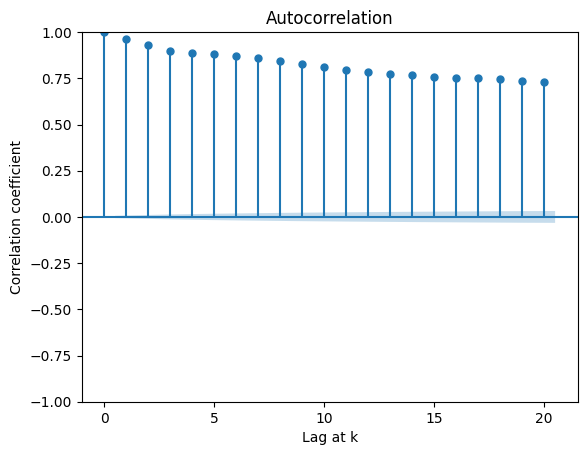

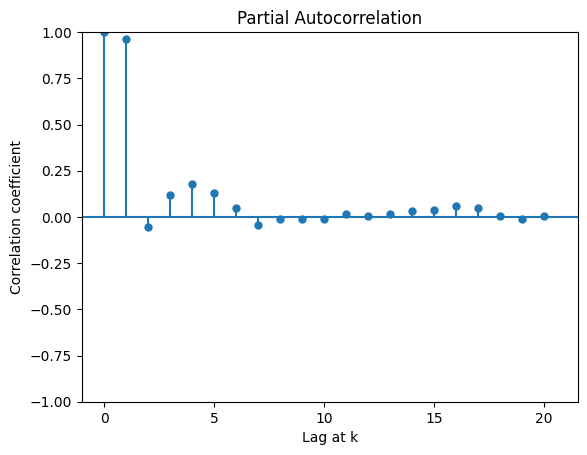

In [ ]:
sv = StationnaryViz(choosed_df[:100000], TARGET)
# sv.plot_target()
sv.plot_autocorrelation_target()
sv.plot_partial_autocorrelation_target()


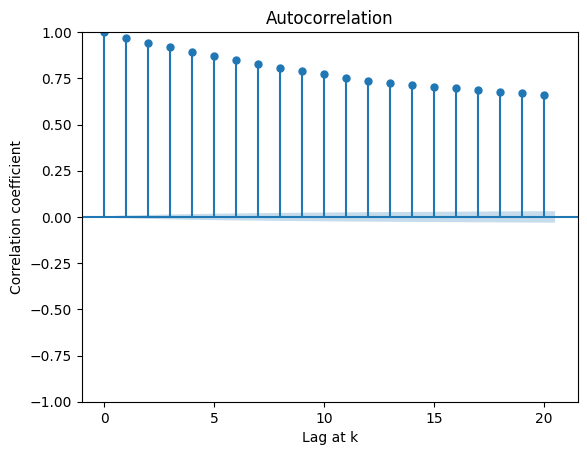

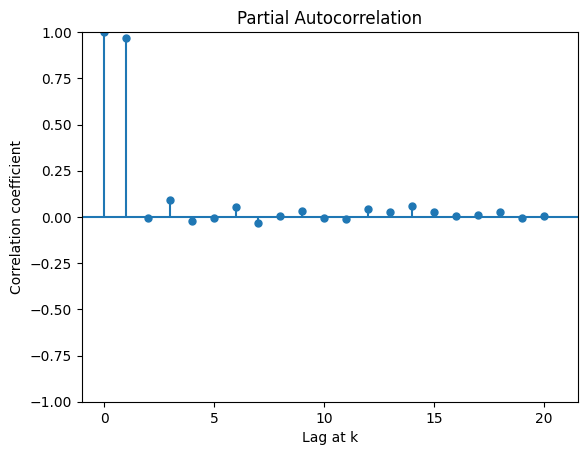

In [ ]:
sv = StationnaryViz(choosed_df[-100000:], TARGET)
# sv.plot_target()
sv.plot_autocorrelation_target()
sv.plot_partial_autocorrelation_target()


### 6.2 ADF, KPSS, PP

D'après les différents tests de stationnarité, nous pouvons conclure à la stationnarité de la série.

In [ ]:
st = StationarityTest(choosed_df[:100000])
st.adf_test([TARGET])
st.kpss_test([TARGET])
st.pp_test([TARGET])


ADF test pour Global_active_power_Wh:
ADF statistique: -16.3796638002048
p-value: 2.759358304366419e-29
Valeurs critiques: {'1%': -3.4304154398333235, '5%': -2.861568923380865, '10%': -2.5667853949035773}
L'hypothèse nulle de non stationnarité a été rejeté, la série est donc stationnaire. 

KPSS test pour Global_active_power_Wh:
KPSS statistique: 1.2653991783866485
p-value: 0.01
Lag utilisé: 175
L'hypothèse nulle de non stationnarité a été rejeté, la série est donc stationnaire. 



/Users/sarrabenyahia/Documents/GitHub/deep-q-learning-time-series/.env/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


Phillips-Perron test pour Global_active_power_Wh:
ADF statistique: -16.447638107003538
p-value: 0.0
Lag utilisé: 68
L'hypothèse nulle de non stationnarité a été rejeté, la série est donc stationnaire. 



In [ ]:
st = StationarityTest(choosed_df[100001:200000])
st.adf_test([TARGET])
st.kpss_test([TARGET])
st.pp_test([TARGET])


ADF test pour Global_active_power_Wh:
ADF statistique: -18.97704276553453
p-value: 0.0
Valeurs critiques: {'1%': -3.430415440488197, '5%': -2.861568923670306, '10%': -2.566785395057637}
L'hypothèse nulle de non stationnarité a été rejeté, la série est donc stationnaire. 

KPSS test pour Global_active_power_Wh:
KPSS statistique: 0.6748792776610859
p-value: 0.015829156576264915
Lag utilisé: 173
L'hypothèse nulle de non stationnarité a été rejeté, la série est donc stationnaire. 

Phillips-Perron test pour Global_active_power_Wh:
ADF statistique: -18.99899695050956
p-value: 0.0
Lag utilisé: 68
L'hypothèse nulle de non stationnarité a été rejeté, la série est donc stationnaire. 



In [ ]:
st = StationarityTest(choosed_df[-100000:])
st.adf_test([TARGET])
st.kpss_test([TARGET])
st.pp_test([TARGET])


ADF test pour Global_active_power_Wh:
ADF statistique: -18.536414836853666
p-value: 2.100141463592367e-30
Valeurs critiques: {'1%': -3.4304154398333235, '5%': -2.861568923380865, '10%': -2.5667853949035773}
L'hypothèse nulle de non stationnarité a été rejeté, la série est donc stationnaire. 

KPSS test pour Global_active_power_Wh:
KPSS statistique: 0.6039269215564065
p-value: 0.022279370767599407
Lag utilisé: 173
L'hypothèse nulle de non stationnarité a été rejeté, la série est donc stationnaire. 

Phillips-Perron test pour Global_active_power_Wh:
ADF statistique: -18.61015872631036
p-value: 0.0
Lag utilisé: 68
L'hypothèse nulle de non stationnarité a été rejeté, la série est donc stationnaire. 



**Lorsqu'on regarde par heure:**  
La présence de saisonnalité peut expliquer le résultat du test KPSS, qui a montré que l'hypothèse nulle de non-stationnarité ne pouvait pas être rejetée. Le test KPSS est souvent sensible aux effets de saisonnalité dans les séries chronologiques, car il teste l'hypothèse que la moyenne de la série est constante sur toute la période d'observation, ce qui peut ne pas être le cas si la série présente une saisonnalité.

Dans notre cas, les tests ADF et Phillips-Perron ont indiqué que la série est stationnaire, tandis que le test KPSS a indiqué que la série est non stationnaire. Les tests ADF et Phillips-Perron sont des tests paramétriques qui testent l'hypothèse de présence de racine unitaire dans la série chronologique, tandis que le test KPSS est un test non paramétrique qui test l'hypothèse de l'absence de racine unitaire dans la série.

Une explication possible pour les résultats contradictoires est que la série chronologique est proche d'être stationnaire, mais pas complètement. Dans de tels cas, les tests paramétriques peuvent indiquer que la série est stationnaire, tandis que le test non paramétrique peut indiquer une non-stationnarité marginale.

Cela nous a conduit à travailler plutôt avec une granularité en minutes

> Train-Test-OOT Split

In [ ]:
# Pour éviter tout biais dans la mesure des performances, nous créons des ensembles de données d'entraînement, de test et hors du temps de manière chronologique.

# Créer des indices pour diviser les données.
num_rows = len(choosed_df)
train_size = 0.7
test_size = 0.2
idx_train = int(num_rows * train_size)
idx_test = idx_train + int(num_rows * test_size)

# Diviser les données en ensembles d'entraînement, de test et hors du temps.
train = choosed_df.iloc[:idx_train]
test = choosed_df.iloc[idx_train:idx_test]
oot = choosed_df.iloc[idx_test:]

# Séparer les variables de caractéristiques et la variable cible pour chaque ensemble.
X_train = train.drop(columns=TARGET)
y_train = train[TARGET]
X_test = test.drop(columns=TARGET)
y_test = test[TARGET]
X_oot = oot.drop(columns=TARGET)
y_oot = oot[TARGET]

# Imprimer le nombre d'observations dans chaque ensemble.
print(
    f"Il y a {X_train.shape[0]} observations dans l'ensemble d'entraînement.")
print(f"Il y a {X_test.shape[0]} observations dans l'ensemble de test.")
print(f"Il y a {X_oot.shape[0]} observations dans l'ensemble hors du temps.")


Il y a 1404256 observations dans l'ensemble d'entraînement.
Il y a 401216 observations dans l'ensemble de test.
Il y a 200609 observations dans l'ensemble hors du temps.


> Features selection

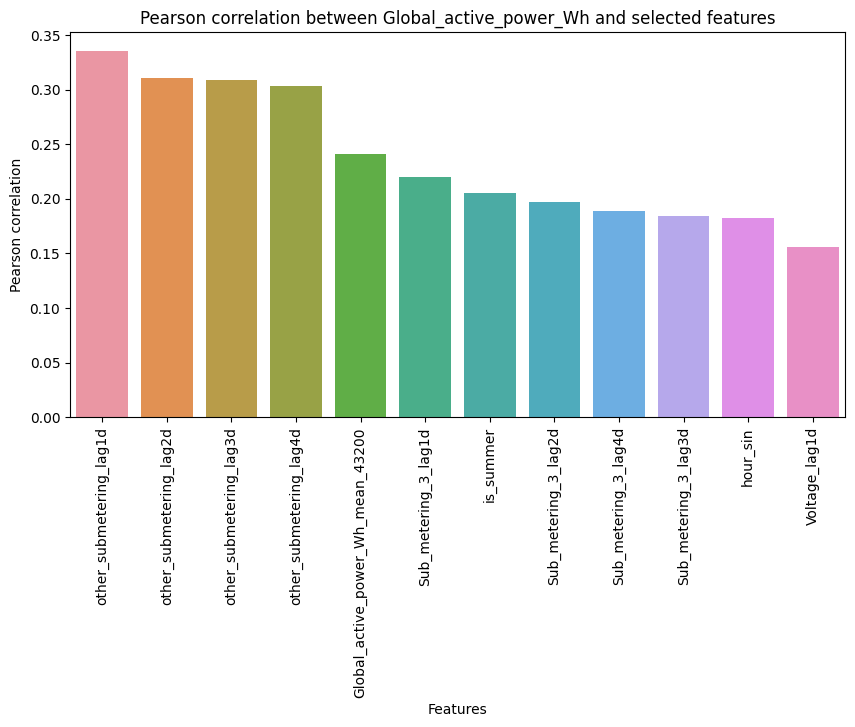

In [ ]:
features = filter_correlated_variables(
    train, TARGET, corr_measure="pearson", min_corr=0.15, max_corr=0.85, max_var_corr=0.7)


> Dataframe final

In [ ]:
os.makedirs('./../data/train_test_oot/', exist_ok=True)

X_train[features].to_pickle('./../data/train_test_oot/X_train.pkl')
X_test[features].to_pickle('./../data/train_test_oot/X_test.pkl')
X_oot[features].to_pickle('./../data/train_test_oot/X_oot.pkl')

y_train.to_pickle('./../data/train_test_oot/y_train.pkl')
y_test.to_pickle('./../data/train_test_oot/y_test.pkl')
y_oot.to_pickle('./../data/train_test_oot/y_oot.pkl')


In [ ]:
X_train = pd.read_pickle('./../data/train_test_oot/X_train.pkl')
X_test = pd.read_pickle('./../data/train_test_oot/X_test.pkl')
X_oot = pd.read_pickle('./../data/train_test_oot/X_oot.pkl')

y_train = pd.read_pickle('./../data/train_test_oot/y_train.pkl')
y_test = pd.read_pickle('./../data/train_test_oot/y_test.pkl')
y_oot = pd.read_pickle('./../data/train_test_oot/y_oot.pkl')


---

## 7. Sélection de différents modèles (explications des critères de sélection, choix de la métrique...)

> Benchmark naïf des 24 dernières heures et Benchmark saisonnier

Utiliser des modèles simples et naïfs pour établir une référence de performance peut être un bon point de départ pour comprendre les défis que les modèles plus avancés devront relever. Ces modèles nous aident également à identifier les limites potentielles de la série temporelle.

Le modèle naïf moyen consiste à prédire la valeur future comme étant la moyenne des valeurs passées de la série temporelle. C'est un peu comme si on prévoyait que demain sera similaire à la moyenne des jours précédents. Ce modèle est facile à comprendre, mais il ne tient pas compte des variations ou des tendances qui peuvent survenir dans la série temporelle.

Le modèle naïf saisonnier est basé sur l'hypothèse que la saisonnalité de la série temporelle est stable d'une année à l'autre. C'est comme si on prévoyait que demain serait similaire à la même période de l'année précédente. Ce modèle peut être utile pour les séries temporelles saisonnières, mais il peut ne pas être efficace si les saisons varient beaucoup ou si des changements significatifs se produisent dans la série temporelle.

MSE benchmark naïf saisonnier = 585.98
MSE benchmark naïf moyen = 383.03


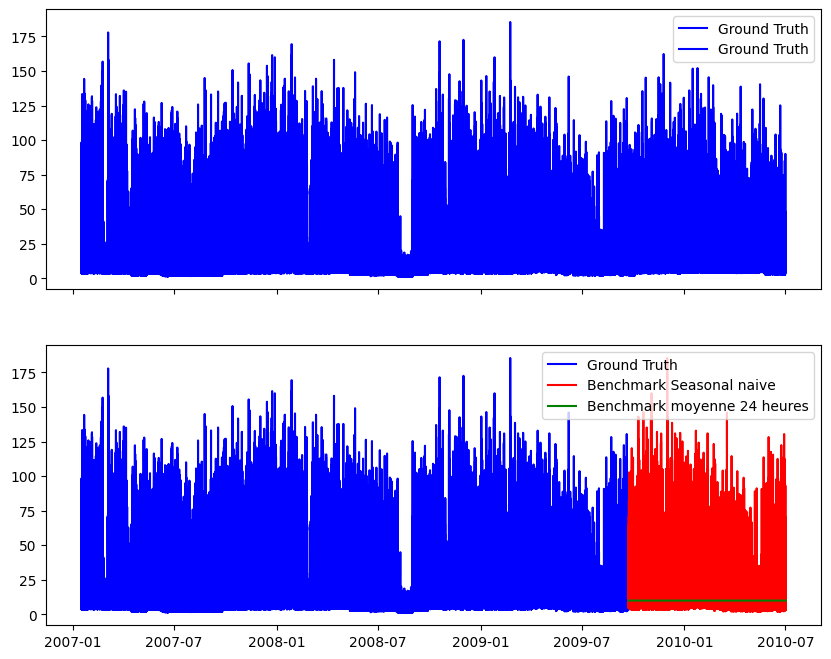

In [ ]:
perf_summary = dict()

# définir les variables
num_hours = 24  # nombre d'heures pour la moyenne naïve
num_samples = X_test.shape[0]  # nombre d'échantillons de test
target_column = 'Global_active_power_Wh'  # nom de la colonne cible

# moyenne naïve
last_24_hours_mean = np.mean(train[target_column][-num_hours:])
y_pred_mean = np.ones(num_samples) * last_24_hours_mean
mse_mean = mean_squared_error(y_test, y_pred_mean)
perf_summary['Naive mean 24 hours'] = mse_mean

# saisonnière naïve
y_pred_seas = train[target_column][-num_samples:]
mse_seas = mean_squared_error(y_test, y_pred_seas)
perf_summary['Seasonal naive'] = mse_seas

# tracer la courbe de la vérité au sol et les prédictions
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8), sharex=True)

axes[0].plot(train.index, train[target_column], c='b', label='Ground Truth')
axes[0].plot(X_test.index, y_test, c='b', label='Ground Truth')
axes[0].legend()
axes[1].plot(train.index, train[target_column], c='b', label='Ground Truth')
axes[1].plot(X_test.index, y_pred_seas, c='r',
             label='Benchmark Seasonal naive')
axes[1].plot(X_test.index, y_pred_mean, c='g',
             label='Benchmark moyenne 24 heures')
axes[1].legend()

# afficher les résultats
print(f"MSE benchmark naïf saisonnier = {mse_seas:.2f}")
print(f"MSE benchmark naïf moyen = {mse_mean:.2f}")


> Modèle de régression

Après avoir mis en place nos modèle benchmark, nous allons ajuster une régression linéaire multiple avec la variable de sortie "Global_active_power_Wh" et 11 variables d'entrée: "Sub_metering_3_lag2d", "other_submetering_lag3d", "Sub_metering_3_lag4d", "hour_sin", "Voltage_lag1d", "Global_active_power_Wh_mean_43200", "other_submetering_lag4d", "other_submetering_lag2d", "is_summer", "Sub_metering_3_lag1d", et "other_submetering_lag1d", et  "Sub_metering_3_lag3d".

In [ ]:
X_train.columns


Index(['other_submetering_lag4d', 'Voltage_lag1d', 'other_submetering_lag2d',
       'other_submetering_lag1d', 'Global_active_power_Wh_mean_43200',
       'other_submetering_lag3d', 'Sub_metering_3_lag4d', 'hour_sin',
       'Sub_metering_3_lag2d', 'Sub_metering_3_lag3d', 'is_summer',
       'Sub_metering_3_lag1d'],
      dtype='object')

In [ ]:
import statsmodels.formula.api as sm

model = sm.ols(formula='Global_active_power_Wh ~  Sub_metering_3_lag2d + other_submetering_lag3d + Sub_metering_3_lag4d + hour_sin + Voltage_lag1d + Global_active_power_Wh_mean_43200 + other_submetering_lag4d + other_submetering_lag2d + is_summer + Sub_metering_3_lag1d + other_submetering_lag1d + Sub_metering_3_lag3d', data=train).fit()
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                              
==================================================================================
Dep. Variable:     Global_active_power_Wh   R-squared:                       0.229
Model:                                OLS   Adj. R-squared:                  0.229
Method:                     Least Squares   F-statistic:                 3.478e+04
Date:                    Tue, 18 Apr 2023   Prob (F-statistic):               0.00
Time:                            22:27:34   Log-Likelihood:            -5.8619e+06
No. Observations:                 1404256   AIC:                         1.172e+07
Df Residuals:                     1404243   BIC:                         1.172e+07
Df Model:                              12                                         
Covariance Type:                nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Intercept                            83.1728      1.113     74.756      0.000      80.992      85.353
Sub_metering_3_lag2d                  0.1576      0.002     90.688      0.000       0.154       0.161
other_submetering_lag3d               0.1589      0.002     95.779      0.000       0.156       0.162
Sub_metering_3_lag4d                  0.1482      0.002     85.711      0.000       0.145       0.152
hour_sin                             -2.4563      0.020   -123.681      0.000      -2.495      -2.417
Voltage_lag1d                        -0.3297      0.005    -70.866      0.000      -0.339      -0.321
Global_active_power_Wh_mean_43200     0.2437      0.004     65.233      0.000       0.236       0.251
other_submetering_lag4d               0.1504      0.002     91.565      0.000       0.147       0.154
other_submetering_lag2d               0.1523      0.002     91.747      0.000       0.149       0.156
is_summer                            -1.9533      0.038    -51.453      0.000      -2.028      -1.879
Sub_metering_3_lag1d                  0.2031      0.002    114.092      0.000       0.200       0.207
other_submetering_lag1d               0.2151      0.002    126.784      0.000       0.212       0.218
Sub_metering_3_lag3d                  0.1204      0.002     69.272      0.000       0.117       0.124
==============================================================================
Omnibus:                   529791.009   Durbin-Watson:                   0.089
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          2496881.772
Skew:                           1.799   Prob(JB):                         0.00
Kurtosis:                       8.453   Cond. No.                     2.03e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.03e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

MSE = 223.28


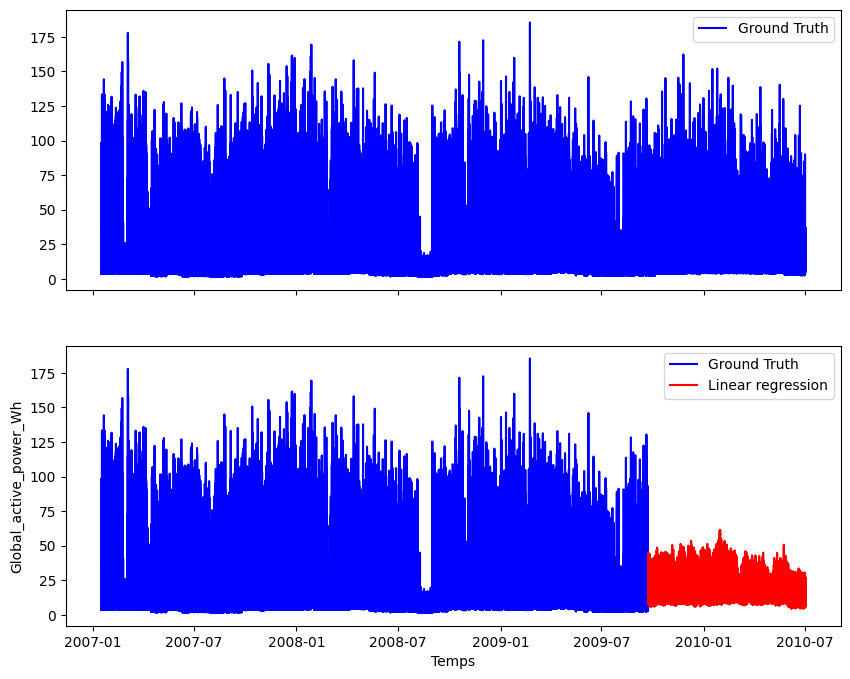

In [ ]:
y_pred_lin = model.predict(X_test)

MSE = mean_squared_error(y_test, y_pred_lin)
print("MSE = %.2f" % MSE)
perf_summary['Regression Lineaire'] = MSE

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8), sharex=True)

axes[0].plot(train.index, train[target_column], c='b', label='Ground Truth')
axes[0].plot(X_test.index, y_test, c='b')
axes[0].legend()
axes[1].plot(train.index, train[target_column], c='b', label='Ground Truth')
plt.plot(X_test.index, y_pred_lin, c='r', label='Linear regression')
axes[1].legend()
plt.xlabel('Temps')
plt.ylabel('Global_active_power_Wh')
plt.show()


Les résultats montrent les performances d'un modèle qui tente de prédire une variable de sortie appelée "Global_active_power_Wh", à l'aide de 12 variables d'entrée. Le coefficient de détermination de 0,229 indique que le modèle explique environ 23% de la variation de la variable de sortie, ce qui n'est pas très bon.

Le F-statistic est élevé, ce qui est une bonne nouvelle, car cela indique que le modèle est significatif et que les variables d'entrée ont une influence sur la variable de sortie. Les valeurs p, qui mesurent la probabilité que les variables d'entrée soient nulles, sont très faibles pour toutes les variables, ce qui est une autre bonne nouvelle.

Le coefficient de chaque variable d'entrée indique la direction et la force de l'effet sur la variable de sortie. Par exemple, le coefficient de "Sub_metering_3_lag2d" suggère que si cette variable augmente de 1 unité, la variable de sortie augmentera de 0,1576 unités. De même, le coefficient de "hour_sin" suggère qu'une augmentation de 1 unité de cette variable entraîne une diminution de la variable de sortie de 2,4563 unités.

Les valeurs de l'Omnibus et du Jarque-Bera testent si les résidus (les différences entre les prédictions du modèle et les valeurs réelles) suivent une distribution normale. Les résultats indiquent que les résidus ne suivent pas une distribution normale, ce qui peut poser des problèmes pour le modèle.

Enfin, le conditionnement mesure la corrélation entre les variables d'entrée. Dans ce cas, les variables d'entrée sont corrélées, mais pas suffisamment pour rendre le modèle instable.

En conséquence, même si la MSE s'améliore par rapport à notre benchmark, il peut être judicieux d'envisager d'autres modèles plus complexes ou de revoir les variables d'entrée pour améliorer les performances de prédiction. Cependant, cela dépend également du contexte de l'application et des performances requises pour répondre aux objectifs. Dans l'ensemble, la décision de conserver ou de rejeter ce modèle dépend de l'analyse du contexte et des performances souhaitées.

> LGBM

LightGBM est une méthode d'apprentissage ensembliste basée sur la construction d'arbres de décision, similaire à XGBoost. Toutefois, LightGBM utilise une approche différente pour construire les arbres de décision, qui est plus rapide et plus efficace en termes de mémoire.

Dans LightGBM, chaque arbre de décision est construit en utilisant une méthode de partitionnement de niveau, qui divise les données en fonction des caractéristiques les plus importantes et des valeurs de seuil associées. Cette approche permet de construire des arbres plus profonds et plus étroits, ce qui conduit à une meilleure précision et à une réduction de la variance.

LightGBM utilise également un algorithme de descente de gradient stochastique régularisée pour optimiser la fonction de coût, tout comme XGBoost. Cela permet une convergence rapide et efficace vers les paramètres optimaux.

Le modèle final est obtenu en combinant les prédictions de tous les arbres de décision construits. Les prédictions sont pondérées en fonction de leur précision, et une régularisation L1 et L2 est utilisée pour éviter le surajustement, tout comme dans XGBoost.

La formule générale pour les prédictions d'un modèle LightGBM est similaire à celle de XGBoost :

$$ŷ_i = ∑k=1^K f_k(x_i)$$


où $ŷ_i$ est la prédiction de la variable de sortie pour l'observation $i$, $K$ est le nombre d'arbres de décision dans le modèle, et $f_k(x_i)$ est la prédiction de l'arbre de décision $k$ pour l'observation $i$.

Chaque arbre de décision est représenté par une fonction $f_k$, qui prend les variables d'entrée $x_i$ comme entrée et renvoie une prédiction $f_k(x_i)$. Toutefois, la fonction $f_k$ est construite différemment dans LightGBM :

$$f_k(x_i) = w_{q(x_i)}$$

où $w$ est un vecteur de poids associé aux feuilles de l'arbre, et $q(x_i)$ est la feuille de l'arbre à laquelle l'observation $x_i$ appartient. Le vecteur de poids $w$ est calculé en minimisant la fonction de coût en utilisant un algorithme de descente de gradient stochastique régularisée.

MSE = 217.14


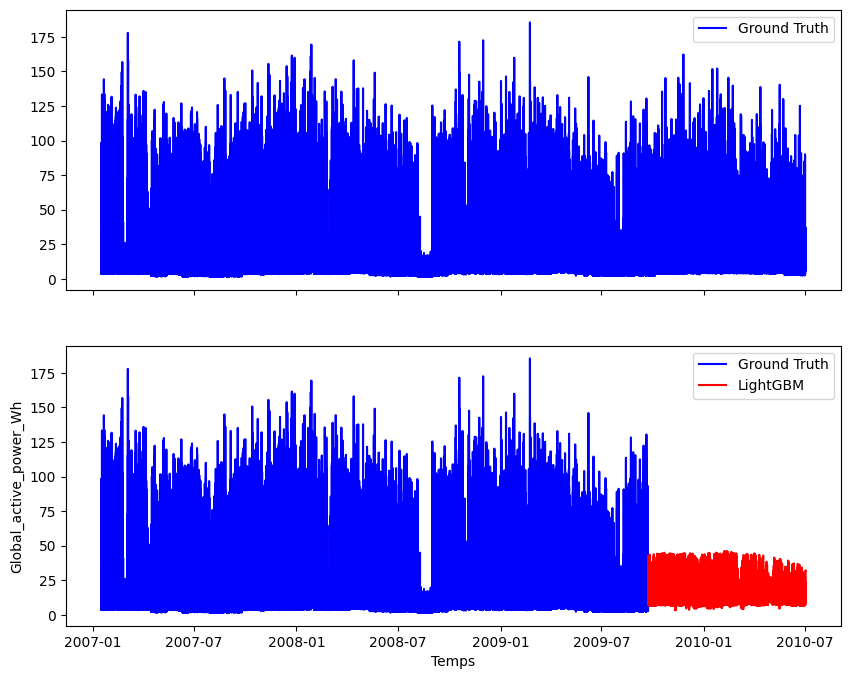

In [ ]:
import lightgbm as lgb
from sklearn.metrics import mean_squared_error

# Instantiate the LGBMRegressor model with some hyperparameters
model = lgb.LGBMRegressor(
    objective='regression', learning_rate=0.1, n_estimators=100, max_depth=3, random_state=42)
# Fit the model to the training data
model.fit(X_train, y_train)
# Predict on the testing data
y_pred_lgb = model.predict(X_test)

# Calculate the mean squared error
MSE_lgb = mean_squared_error(y_test, y_pred_lgb)
print("MSE = %.2f" % MSE_lgb)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8), sharex=True)

axes[0].plot(train.index, train[TARGET], c='b', label='Ground Truth')
axes[0].plot(X_test.index, y_test, c='b')
axes[0].legend()
axes[1].plot(train.index, train[TARGET], c='b', label='Ground Truth')
plt.plot(X_test.index, y_pred_lgb, c='r', label='LightGBM')
axes[1].legend()
plt.xlabel('Temps')
plt.ylabel('Global_active_power_Wh')
plt.show()



> ConvLSTM

La structure du modèle ConvLSTM2D est basée sur les LSTM (Long Short-Term Memory), qui sont des réseaux de neurones récurrents capables de prendre en compte les dépendances temporelles dans les données d'entrée. Toutefois, les ConvLSTM2D étendent cette capacité aux relations spatiales des données. Les LSTM et ConvLSTM2D partagent une structure similaire, mais avec quelques différences importantes.

Le LSTM utilise des portes (gates) pour réguler l'information qui est transmise d'une cellule à une autre. Les portes sont des couches de neurones qui prennent en entrée les sorties de la couche précédente, ainsi que les données d'entrée, et qui produisent des valeurs comprises entre 0 et 1. Ces valeurs sont ensuite multipliées par l'état de la cellule pour contrôler la quantité d'information qui est transmise.

La formule de mise à jour pour un LSTM est la suivante :

$$i_t = \sigma(W_i . [h_{t-1}, x_t] + b_i)$$
$$f_t = \sigma(W_f . [h_{t-1}, x_t] + b_f)$$
$$o_t = \sigma(W_o . [h_{t-1}, x_t] + b_o)$$
$$c_t = f_t * c_{t-1} + i_t * tanh(W_c . [h_{t-1}, x_t] + b_c)$$
$$h_t = o_t * tanh(c_t)$$

Où :

- $x_t$ est l'entrée au temps t
- $h_{t-1}$ est la sortie de la couche précédente au temps t-1
- $i_t, f_t,$ et $o_t$ sont respectivement les vecteurs d'entrée, de l'oubli, et de sortie
- $c_t$ est l'état de la cellule à l'instant t
- $W_i, W_f, W_o, W_c $ sont des poids à apprendre pour chaque porte et chaque état de cellule
- $b_i, b_f, b_o, b_c$sont les biais correspondant à chaque porte et chaque état de cellule

$\sigma$ est la fonction d'activation sigmoid, tanh est la fonction d'activation tanh
Les ConvLSTM2D étendent cette idée en ajoutant des convolutions 2D dans les LSTM. Les convolutions 2D permettent de prendre en compte les relations spatiales des données, en calculant des convolutions sur des fenêtres de taille spécifiée dans les données d'entrée.

La formule de mise à jour pour un ConvLSTM2D est la suivante :

$$i_{t} = \sigma(W_i * X_{t} + U_i * H_{t-1} + b_i)$$
$$f_{t} = \sigma(W_f * X_{t} + U_f * H_{t-1} + b_f)$$
$$o_{t} = \sigma(W_o * X_{t} + U_o * H_{t-1} + b_o)$$
$$C_{t} = f_{t} * C_{t-1} + i_{t} * tanh(W_c * X_{t} + U_c * H_{t-1} + b_c)$$
$$H_{t} = o_{t} * tanh(C_{t})$$

Où :

- $X_t$ est l'entrée au temps t, qui est une tensor 5D avec les dimensions (batch_size, num_frames, rows, cols, num_channels), où batch_size représente le nombre d'échantillons dans chaque batch, num_frames est le nombre de frames dans chaque séquence temporelle, rows et cols représentent la hauteur et la largeur des données d'entrée, et num_channels est le nombre de canaux dans les données d'entrée.
- $H_{t-1}$ est la sortie de la couche précédente au temps t-1, qui est également un tensor 5D avec les mêmes dimensions que $X_t$.
- $i_t, f_t, et o_t$ sont les vecteurs d'entrée, d'oubli et de sortie, respectivement, qui sont des tensors 5D avec des dimensions de (batch_size, 1, rows, cols, num_filters) où num_filters représente le nombre de filtres (neurones) dans la couche.
- $C_t$ est l'état de la cellule à l'instant t, qui est également un tensor 5D avec des dimensions de (batch_size, 1, rows, cols, num_filters).
- $W_i, W_f, W_o, W_c, U_i, U_f, U_o, U_c$ sont des poids à apprendre pour chaque porte et chaque état de cellule, qui sont des tensors 5D de la forme (kernel_rows, kernel_cols, input_filters, output_filters).
- $b_i, b_f, b_o, b_c$ sont les biais correspondant à chaque porte et chaque état de cellule, qui sont des tensors 1D avec la forme (num_filters).
- $\sigma$ est la fonction d'activation sigmoid, tanh est la fonction d'activation tangente hyperbolique.


Dans le modèle présenté, trois couches ConvLSTM2D sont empilées les unes sur les autres. La première couche a 64 filtres, une taille de noyau de (1,2), et une activation linéaire. La deuxième couche a 32 filtres, une taille de noyau de (1,2), et une activation sigmoïde. La troisième couche a 16 filtres, une taille de noyau de (1,2), et une activation tanh. Chaque couche est suivie d'une couche Dropout pour éviter le surapprentissage.

Enfin, une couche Flatten est ajoutée pour convertir les sorties de la dernière couche ConvLSTM2D en un vecteur. Deux couches Dense sont ensuite ajoutées, la première avec 64 neurones et une activation relu, et la deuxième avec une sortie unique pour la régression. Le modèle est compilé avec une perte mean_squared_error et l'optimiseur Adam.

In [ ]:
from keras.models import Sequential
from keras.layers import ConvLSTM2D, Dense, Flatten, Dropout
from sklearn.preprocessing import StandardScaler


In [ ]:
# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reshape the features into the required shape for ConvLSTM2D
X_train_reshaped = X_train_scaled.reshape(
    (X_train_scaled.shape[0], 1, 1, X_train_scaled.shape[1], 1))
X_test_reshaped = X_test_scaled.reshape(
    (X_test_scaled.shape[0], 1, 1, X_test_scaled.shape[1], 1))

# Define the model
model = Sequential()
model.add(ConvLSTM2D(filters=64, kernel_size=(1, 2), activation='linear',
          input_shape=(1, 1, X_train_scaled.shape[1], 1), return_sequences=True))
model.add(Dropout(0.2))
model.add(ConvLSTM2D(filters=32, kernel_size=(1, 2),
          activation='sigmoid', return_sequences=True))
model.add(Dropout(0.2))
model.add(ConvLSTM2D(filters=16, kernel_size=(1, 2),
          activation='tanh', return_sequences=False))
model.add(Dropout(0.2))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1))

# Compile the model
model.compile(loss='mean_squared_error', optimizer='adam')

# Fit the model
history = model.fit(X_train_reshaped, y_train, epochs=5,
                    batch_size=32, validation_data=(X_test_reshaped, y_test))

# Evaluate the model
score = model.evaluate(X_test_reshaped, y_test, verbose=0)
print('Test loss:', score)


Epoch 1/5


2023-04-19 00:55:47.690892: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


43883/43883 [==============================] - 273s 6ms/step - loss: 255.3360 - val_loss: 225.9472
Epoch 2/5
43883/43883 [==============================] - 269s 6ms/step - loss: 246.3755 - val_loss: 217.4117
Epoch 3/5
43883/43883 [==============================] - 266s 6ms/step - loss: 243.5586 - val_loss: 216.5436
Epoch 4/5
43883/43883 [==============================] - 266s 6ms/step - loss: 242.4051 - val_loss: 216.6032
Epoch 5/5
43883/43883 [==============================] - 266s 6ms/step - loss: 241.8311 - val_loss: 216.4138
Test loss: 216.413818359375


In [ ]:
# Save the model using pickle
with open('./../data/convlstm/convlstm.pkl', 'wb') as file:
    pickle.dump(model, file)


In [ ]:
# Generate predictions on the test set
y_pred_clstm = model.predict(X_test_reshaped)


12538/12538 [==============================] - 15s 1ms/step


MSE = 217.18


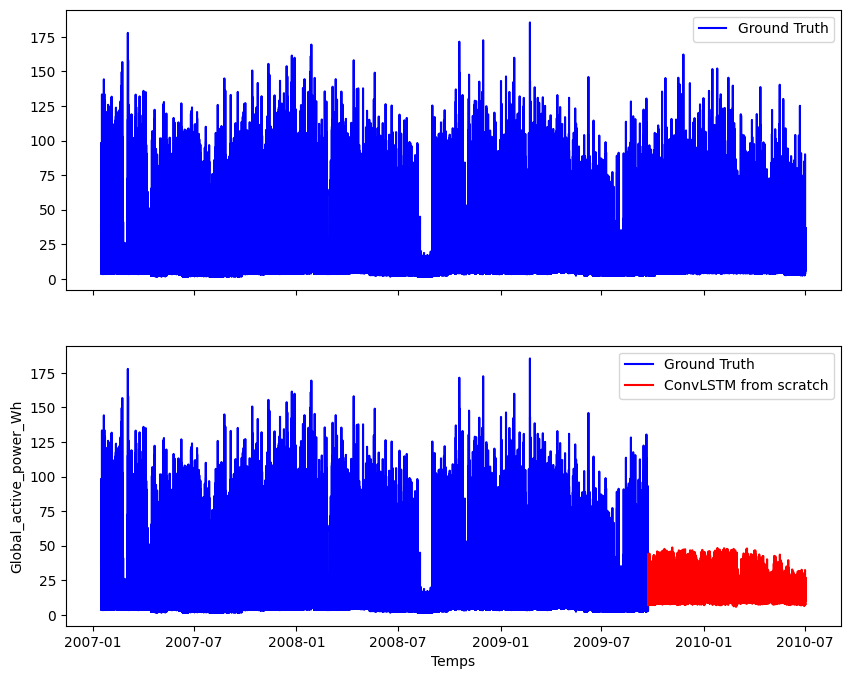

In [ ]:
import matplotlib.pyplot as plt

MSE = mean_squared_error(y_test, y_pred_clstm)
print("MSE = %.2f" % MSE)


fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8), sharex=True)

axes[0].plot(train.index, train[target_column], c='b', label='Ground Truth')
axes[0].plot(X_test.index, y_test, c='b')
axes[0].legend()
axes[1].plot(train.index, train[target_column], c='b', label='Ground Truth')
plt.plot(X_test.index, y_pred_clstm, c='r', label='ConvLSTM from scratch')
axes[1].legend()
plt.xlabel('Temps')
plt.ylabel('Global_active_power_Wh')
plt.show()


## 8. Evaluation de la performance des modèles (recherche d'hyperparamètres, contrôle de l’overfitting, comparaison des performances) sur différents horizons de prédiction

Pour notre première sélection, nous allons prendre en compte les modèles qui offrent les meilleurs résultats en termes de performance de MSE. Cela nous permettra d'économiser du temps sur l'hyperparamétrisation de Gridsearch, qui peut être chronophage sur certains modèles, et de renforcer au maximum nos meilleurs modèles.

Nous veillerons à prendre en compte l'overfitting que nous pouvons déjà constater sur le ConvLSTM, en observant la différence entre la loss et la val_loss. Nous utiliserons cette hyperparamétrisation pour éviter ce problème.

Nous allons chercher à optimiser les modèles LGBM et ConvLSTM, qui ont produit les plus petites MSE sans hyper-paramétrisation. Nous allons explorer différentes options d'optimisation pour améliorer encore plus la performance de ces modèles, afin de produire des prévisions plus précises et fiables.

> Hyperparamétrisation du LGBM

Nous lançons un bayesian-searchCV sur les lightgbm sur les hyper-paramètres suivants : 

- Le  learning_rate contrôle la vitesse à laquelle le modèle se rapproche de la solution optimale. Si la valeur de learning_rate est faible, le modèle se déplace lentement vers la solution optimale, ce qui peut améliorer la généralisation.

- Le n_estimators définit le nombre d'arbres que le modèle construit lors de l'entraînement. Plus le nombre d'arbres est élevé, plus le modèle est complexe et peut potentiellement sur-apprendre.

- Le max_depth définit la profondeur maximale de chaque arbre de décision dans le modèle. Une profondeur plus grande permet au modèle de mieux s'adapter aux données d'entraînement, mais cela peut également augmenter le risque de sur-apprentissage.

- Les paramètres reg_alpha et reg_lambda contrôlent la force de la régularisation L1 et L2 appliquée aux coefficients de chaque arbre dans le modèle. L'ajout de régularisation peut aider à éviter le sur-apprentissage en empêchant les coefficients de prendre des valeurs extrêmes.

- min_child_samples définit le nombre minimum d'échantillons requis pour être à un nœud de feuille. Une valeur plus élevée peut aider à prévenir l'overfitting en nécessitant plus d'échantillons pour être présents dans un nœud de feuille.

- min_child_weight définit le poids minimum (somme des poids d'instance) requis pour être à un nœud de feuille. Cela peut être utilisé pour contrôler l'équilibre entre l'overfitting et le under-fitting, en exigeant qu'un poids minimum soit présent dans un nœud de feuille.

- subsample définit la fraction d'échantillons à utiliser pour chaque itération de boosting. Une valeur plus faible peut aider à réduire l'overfiting en utilisant un sous-ensemble plus petit des données à chaque itération.

En utilisant cette méthode, nous explorons différentes combinaisons d'hyperparamètres afin de trouver la configuration optimale qui permet d'obtenir le meilleur compromis entre précision et généralisation. Cela permet d'obtenir un modèle qui est capable de bien généraliser à de nouvelles données, tout en ayant une bonne précision sur les données d'entraînement.

In [ ]:
import lightgbm as lgb
from skopt import BayesSearchCV
from skopt.space import Real, Integer, Categorical
from sklearn.metrics import mean_squared_error

# Define the model
model = lgb.LGBMRegressor(objective='regression', random_state=42)

# Define the parameter distribution
param_dist = {
    'learning_rate': Real(0.01, 0.3, prior='log-uniform'),
    'n_estimators': Integer(50, 300),
    'max_depth': Integer(2, 10),
    'num_leaves': Integer(2, 50),
    'min_child_samples': Integer(2, 30),
    'min_child_weight': Real(1e-5, 1e-1, prior='log-uniform'),
    'subsample': Real(0.5, 1.0, prior='uniform'),
    'colsample_bytree': Real(0.5, 1.0, prior='uniform'),
    'reg_alpha': Real(1e-6, 10, prior='log-uniform'),
    'reg_lambda': Real(1e-6, 10, prior='log-uniform'),
}

# Perform the Bayesian optimization search
opt = BayesSearchCV(
    estimator=model,
    search_spaces=param_dist,
    cv=3,
    n_iter=50,
    random_state=42,
    verbose=2,
)

opt.fit(X_train, y_train)

# Get the best estimator from the Bayesian optimization search
best_lgb_model = opt.best_estimator_


Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV] END colsample_bytree=0.705051979426657, learning_rate=0.11883357504897696, max_depth=9, min_child_samples=11, min_child_weight=0.00479282744059693, n_estimators=154, num_leaves=19, reg_alpha=0.15015148762726388, reg_lambda=0.00013528298497308456, subsample=0.8238957941734388; total time=   4.5s
[CV] END colsample_bytree=0.705051979426657, learning_rate=0.11883357504897696, max_depth=9, min_child_samples=11, min_child_weight=0.00479282744059693, n_estimators=154, num_leaves=19, reg_alpha=0.15015148762726388, reg_lambda=0.00013528298497308456, subsample=0.8238957941734388; total time=   9.6s
[CV] END colsample_bytree=0.705051979426657, learning_rate=0.11883357504897696, max_depth=9, min_child_samples=11, min_child_weight=0.00479282744059693, n_estimators=154, num_leaves=19, reg_alpha=0.15015148762726388, reg_lambda=0.00013528298497308456, subsample=0.8238957941734388; total time=   4.4s
Fitting 3 folds for each of 1 candidat

In [ ]:
y_pred_lgbm_test = best_lgb_model.predict(X_test)
mean_squared_error(y_test, y_pred_lgbm_test)


214.9586219522621

> Hyperparamétrisation du ConvLSTM

Dans ce code, nous définissons une grille de recherche d'hyperparamètres pour un modèle de Convolutional LSTM (ConvLSTM). Les hyperparamètres inclus dans la grille de recherche sont les suivants:

- filters_1, filters_2 et filters_3 sont les nombres de filtres à utiliser dans les trois couches de ConvLSTM. Une valeur plus grande implique une représentation plus complexe, mais peut également augmenter le risque de sur-apprentissage.

- kernel_size_1, kernel_size_2 et kernel_size_3 sont les tailles de noyau à utiliser dans les trois couches de ConvLSTM. Une taille plus grande permet d'examiner un contexte plus large, mais peut également augmenter la complexité du modèle.

- activation_1, activation_2 et activation_3 sont les fonctions d'activation à utiliser dans les trois couches de ConvLSTM. Les fonctions d'activation permettent au modèle de modéliser des relations non linéaires entre les entrées et les sorties.

- dense_units est le nombre d'unités dans la couche de sortie dense. Une valeur plus grande permet de capturer des relations plus complexes entre les entrées et les sorties, mais peut également augmenter la complexité du modèle.

- dropout_rate est le taux de dropout à utiliser dans la couche dense. Le dropout permet d'éviter le sur-apprentissage en supprimant aléatoirement des connexions entre les neurones de la couche dense.

- optimizer est l'algorithme d'optimisation à utiliser pour entraîner le modèle. Les algorithmes d'optimisation permettent de trouver les valeurs optimales pour les poids du modèle.

In [ ]:
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasRegressor
from keras.layers import ConvLSTM2D, Dropout, Flatten, Dense
from keras.models import Sequential
from sklearn.preprocessing import StandardScaler

# Define a function to create the model with hyperparameters


def create_model(filters_1=64, kernel_size_1=(1, 2), activation_1='linear',
                 filters_2=32, kernel_size_2=(1, 2), activation_2='sigmoid',
                 filters_3=16, kernel_size_3=(1, 2), activation_3='tanh',
                 dense_units=64, dropout_rate=0.5, optimizer='adam'):
    model = Sequential()
    model.add(ConvLSTM2D(filters=filters_1, kernel_size=kernel_size_1,
                         activation=activation_1, input_shape=(1, 1, X_train_scaled.shape[1], 1), return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(ConvLSTM2D(filters=filters_2, kernel_size=kernel_size_2,
                         activation=activation_2, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(ConvLSTM2D(filters=filters_3, kernel_size=kernel_size_3,
                         activation=activation_3, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Flatten())
    model.add(Dense(dense_units, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1))

    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model


# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reshape the features into the required shape for ConvLSTM2D
X_train_reshaped = X_train_scaled.reshape(
    (X_train_scaled.shape[0], 1, 1, X_train_scaled.shape[1], 1))
X_test_reshaped = X_test_scaled.reshape(
    (X_test_scaled.shape[0], 1, 1, X_test_scaled.shape[1], 1))

# Create a KerasRegressor
model = KerasRegressor(build_fn=create_model, epochs=10,
                       batch_size=32, verbose=0)

# Define the hyperparameters to search over
param_grid = {
    'filters_1': [32, 64],
    'kernel_size_1': [(1, 2), (1, 3)],
    'activation_1': ['linear', 'relu'],
    'filters_2': [16, 32],
    'kernel_size_2': [(1, 2), (1, 3)],
    'activation_2': ['sigmoid', 'tanh'],
    'filters_3': [8, 16],
    'kernel_size_3': [(1, 2), (1, 3)],
    'activation_3': ['linear', 'relu'],
    'dense_units': [32, 64],
    'dropout_rate': [0.2, 0.5],
    'optimizer': ['adam', 'rmsprop']
}

# Perform the grid search
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3)
grid_result = grid.fit(X_train_reshaped, y_train)

#Save best model
best_convLSTM = grid_result.best_estimator_
# Print the results
print(f"Best: {grid_result.best_score_} using {grid_result.best_params_}")



2023-04-18 23:14:34.563661: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-04-18 23:14:34.563670: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-04-18 23:14:34.563671: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-04-18 23:14:34.563673: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-04-18 23:14:34.563672: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-04-18 23:14:34.568615: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-04-18 23:14:34.572027: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-04-18 23:14:34.602158: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


KeyboardInterrupt: 

Malheureusement, nous avons relancé le code sans avoir enregistré les hyperparamètres du ConvLSTM, mais les métriques obtenues n'étaient pas significativement différentes de celles du modèle de base. Nous aurions pu éviter cette situation si nous avions utilisé MLFlow pour gérer l'enregistrement des résultats de nos expériences de modélisation :( . Il est aussi important de noter que nous n'avons pas pu lancer Prophet avec une fréquence de prédiction à la minute, car le kernel plantait systématiquement lors de la prédiction.

> Prédiction sur le split - Out Of Time

In [ ]:
#D'abord pour le LGBM : 
y_pred_lgbm = best_lgb_model.predict(X_oot)

In [ ]:
# Ensuite pour le convLSTM
# y_pred_convLSTM = best_convLSTM.predict(X_oot)

# Reshape the features into the required shape for ConvLSTM2D
X_oot_scaled = scaler.fit_transform(X_oot)
X_oot_reshaped = X_oot_scaled.reshape(
    (X_oot_scaled.shape[0], 1, 1, X_oot_scaled.shape[1], 1))

y_pred_convLSTM = model.predict(X_oot_reshaped)


6270/6270 [==============================] - 9s 1ms/step


> A différentes horizons : Introduction de Prophet

Le modèle Prophet est un modèle de séries chronologiques développé par Facebook en 2017. Ce modèle est conçu pour modéliser des séries chronologiques non stationnaires avec des tendances saisonnières. Il est très utile pour prédire les tendances et les modèles saisonniers dans les données chronologiques.

Le modèle Prophet utilise une approche additive pour modéliser les séries chronologiques, qui peut être exprimée mathématiquement comme suit :

$$y(t) = g(t) + s(t) + h(t) + \epsilon(t)$$

où $y(t)$ est la valeur observée à l'instant t, $g(t)$ est la tendance, $s(t)$ est la saisonnalité, $h(t)$ représente les effets des jours fériés ou événements spéciaux et ε(t) est le bruit résiduel.

La tendance $g(t)$ est modélisée à l'aide d'une fonction sigmoïde logistique qui peut être exprimée comme suit :

$$g(t) = (k + (m - k) / (1 + \exp(-r(t - t_0)))) * trend_prior_scale$$

où k est l'intercept de la tendance, m est la valeur limite de la tendance, r est la croissance de la tendance, $t_0$ est le moment du changement de courbure de la tendance et trend_prior_scale est un paramètre de régularisation.

La saisonnalité $s(t)$ est modélisée à l'aide d'une décomposition de Fourier et peut être exprimée comme suit :

$$s(t) = \sum_{j=1}^N (a_j * cos(2\pi*jt/P) + b_j * sin(2\pi*jt/P))$$

où N est le nombre de termes de Fourier, P est la période de la saisonnalité, et $a_j$ et $b_j$ sont les coefficients de Fourier.

Les effets des jours fériés et événements spéciaux h(t) sont modélisés à l'aide d'un terme binaire qui prend la valeur 1 lorsque l'événement se produit et 0 sinon.

Le modèle Prophet utilise une méthode de régression bayésienne pour estimer les paramètres du modèle. Les paramètres sont optimisés en maximisant la vraisemblance de la distribution de probabilité a posteriori. Le modèle peut être ajusté aux données à l'aide d'une méthode de minimisation de la fonction de perte qui minimise l'erreur quadratique moyenne entre les valeurs observées et les valeurs prédites par le modèle.


Dans notre contexte, il est primordial de pouvoir prévoir avec précision les stocks de gaz et de pétrole ainsi que de réviser régulièrement les centrales nucléaires, surtout après les problèmes survenus en 2022 où toutes les centrales étaient en réparation. De plus, la préparation de batteries ou la diminution de leur utilisation avec une bonne prédiction peut s'avérer très coûteuse, mais cela peut être nécessaire pour assurer la stabilité du réseau électrique.

Il est également important de prendre en compte les intérêts géopolitiques, car pouvoir prévoir sur le plus long terme peut nous éviter l’utilisation de gaz russe lors des problèmes avec l’Ukraine.

Dans ce contexte, l'utilisation de modèles de prévision est indispensable pour aider à la prise de décision. La méthode Prophet peut être très intéressante lorsqu'on change l'horizon à une horizon journalière. En effet, il y aurait plusieurs raisons à modéliser de cette façon, notamment pour prendre en compte les variations de consommation en fonction des jours de la semaine, des jours fériés ou encore des événements spéciaux.

Cependant, nous ne comparerons pas les performances des différents modèles dans cette étude, mais il était tout de même intéressant d'ajouter la méthode Prophet comme proposition de modèle.

In [ ]:
# Python
import pandas as pd
from prophet import Prophet

os.makedirs('./../model/prophet/', exist_ok=True)

train_prophet = daily_df
prophet_df = train_prophet[TARGET].reset_index().rename(columns={'datetime':'ds', 'Global_active_power_Wh':'y'})

In [ ]:
# Model 
m_daily = Prophet()
m_daily.fit(prophet_df)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


In [ ]:
import pickle
# Save the model to a file
with open('./../model/prophet/prophet_model_daily.pkl', 'wb') as f:
    pickle.dump(m_daily, f)

In [ ]:
# Future dates generation
future = m_daily.make_future_dataframe(periods=test.shape[0], freq='D')
future.tail()

,ds
1265,2010-07-03
1266,2010-07-04
1267,2010-07-05
1268,2010-07-06
1269,2010-07-07


In [ ]:
# Forecast generation
forecast = m_daily.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()


,ds,yhat,yhat_lower,yhat_upper
1265,2010-07-03,21882.737870,12129.282991,30886.584307
1266,2010-07-04,21310.570425,11643.798670,30508.786415
1267,2010-07-05,15054.246739,5695.204593,23951.332166
1268,2010-07-06,17428.061011,8264.031306,27166.535411
1269,2010-07-07,17201.909386,8213.853321,26284.457357


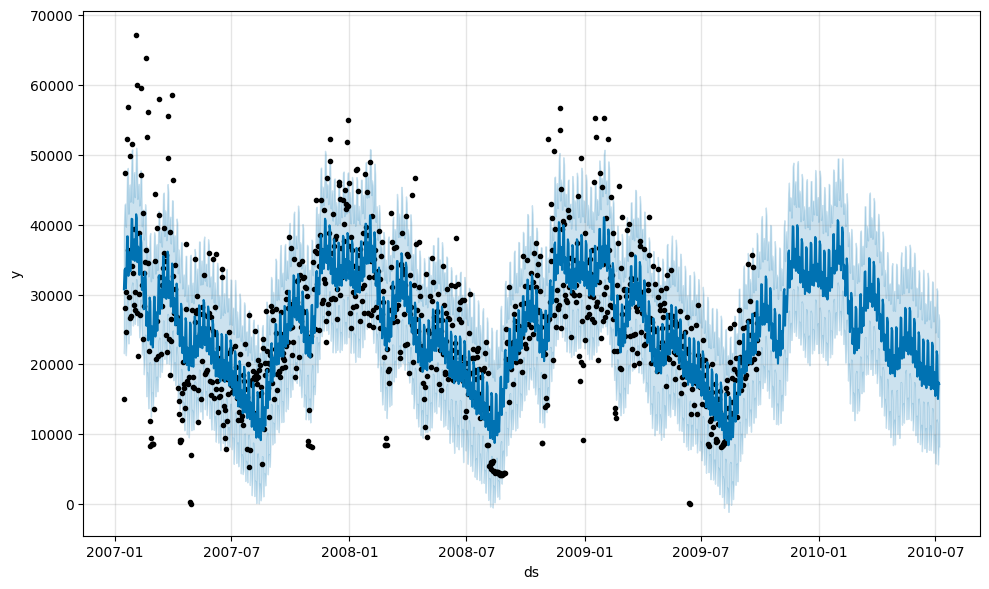

In [ ]:
# Plot forecasts
fig1 = m_daily.plot(forecast)


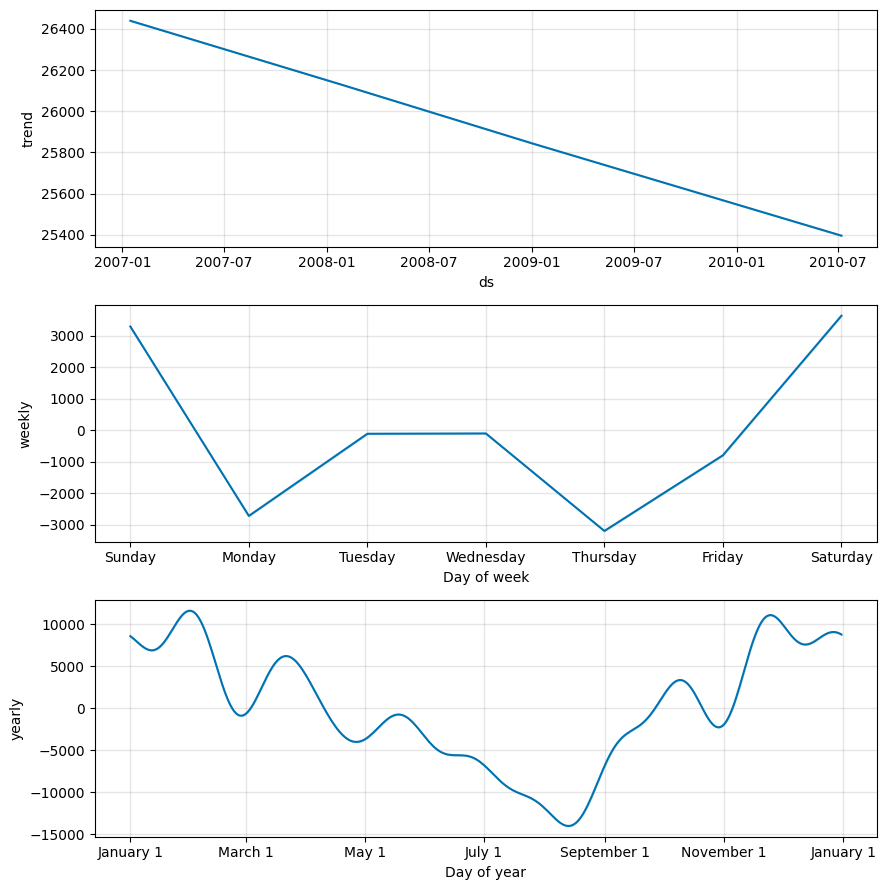

In [ ]:
# Model decomposition
fig2 = m_daily.plot_components(forecast)


In [ ]:
# Interactive plotting
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m_daily, forecast)

> Comparaison des perfomances

- La normalisation de la MSE permet de comparer la précision de prédiction de différents modèles en utilisant une mesure relative, indépendamment de l'unité de la variable cible. Elle se calcule en divisant la racine carrée de la MSE par l'écart type de la variable cible, et indique combien de fois l'erreur de prédiction est plus grande que l'écart type de la variable cible. Une MSE normalisée proche de 1 signifie que les erreurs de prédiction sont similaires à l'écart type de la variable cible. Si la MSE normalisée est inférieure à 1, cela signifie que les erreurs de prédiction sont plus petites que l'écart type de la variable cible.

- Le coefficient de détermination ($R^2$) : cette mesure évalue la proportion de la variance de la variable cible qui est expliquée par le modèle. Un R² proche de 1 indique que le modèle est capable d'expliquer une grande partie de la variance de la variable cible, tandis qu'un R² proche de 0 indique que le modèle ne parvient pas à expliquer la variance de la variable cible.

- L'erreur absolue moyenne (MAE) : cette mesure évalue la magnitude moyenne des erreurs de prédiction en unités de la variable cible. Elle est calculée en prenant la moyenne des valeurs absolues des erreurs de prédiction. Contrairement à la MSE, la MAE ne pénalise pas autant les grandes erreurs de prédiction, ce qui peut la rendre plus robuste face aux valeurs aberrantes.

- La métrique AIC (Akaike Information Criterion) ou BIC (Bayesian Information Criterion) : ces mesures sont utilisées pour évaluer la qualité du modèle en prenant en compte à la fois la précision de prédiction et la complexité du modèle. Elles permettent de pénaliser les modèles trop complexes qui pourraient surajuster les données. Les modèles avec un AIC ou un BIC plus faible sont considérés comme plus performants.

In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error


def evaluate_model(y_true, y_pred, target_std, num_features, num_samples):
    """
    Évalue un modèle de série temporelle en calculant la normalisation de la MSE, le R², la MAE et l'AIC/BIC.

    Args:
    - y_true (array): les vraies valeurs de la variable cible
    - y_pred (array): les valeurs prédites de la variable cible
    - target_std (float): l'écart type de la variable cible
    - num_features (int): le nombre de features utilisées dans le modèle
    - num_samples (int): le nombre d'échantillons utilisés pour évaluer le modèle

    Returns:
    - dict: un dictionnaire contenant les valeurs normalisées de la MSE, du R², de la MAE et de l'AIC/BIC
    """
    # Calcul de la normalisation de la MSE
    mse = mean_squared_error(y_true, y_pred)
    mse_norm = np.sqrt(mse) / target_std

    # Calcul du R²
    r2 = r2_score(y_true, y_pred)

    # Calcul de la MAE
    mae = mean_absolute_error(y_true, y_pred)

    # Calcul de l'AIC/BIC
    k = num_features
    n = num_samples
    aic = n * np.log(mse) + 2 * k
    bic = n * np.log(mse) + k * np.log(n)

    # Stockage des résultats dans un dictionnaire
    results = {'Normalized MSE': mse_norm, 'R²': r2,
               'MAE': mae, 'AIC': aic, 'BIC': bic}

    return results


In [ ]:
results_lgbm = evaluate_model(y_oot, y_pred_lgbm, y_oot.std(), len(model.feature_importances_), X_train.shape[0])
results_lgbm

{'Normalized MSE': 0.8759653593666532,
 'R²': 0.23268084040875225,
 'MAE': 9.074537125627979,
 'AIC': 7119899.71481513,
 'BIC': 7120045.575033328}

In [ ]:
results_convLSTM = evaluate_model(y_oot, y_pred_convLSTM, y_oot.std(), X_train_scaled.shape[1], X_train.shape[0])
results_convLSTM

{'Normalized MSE': 0.8969379,
 'R²': 0.1954982903059862,
 'MAE': 9.621208,
 'AIC': 7186349.371841431,
 'BIC': 7186495.232059628}

In [ ]:
df_lgbm = pd.DataFrame.from_dict(results_lgbm, orient='index', columns=['LGBM'])
df_convLSTM = pd.DataFrame.from_dict(results_convLSTM, orient='index', columns=['ConvLSTM'])

df_results = pd.concat([df_lgbm, df_convLSTM], axis=1)
df_results

,LGBM,ConvLSTM
Normalized MSE,8.759654e-01,8.969379e-01
R²,2.326808e-01,1.954983e-01
MAE,9.074537e+00,9.621208e+00
AIC,7.119900e+06,7.186349e+06
BIC,7.120046e+06,7.186495e+06


## 9. Discussion autour de la performance des modèles


Tout d'abord, considérons les valeurs de MSE normalisées. Avec une valeur cible moyenne de 18,19 et un écart-type de 17,62, les valeurs de MSE normalisées de 0,876 pour LGBM et 0,897 pour ConvLSTM suggèrent que les modèles commettent des erreurs d'une ampleur similaire à la variabilité de la variable cible. En d'autres termes, les modèles ne fonctionnent pas bien en termes de précision de prédiction, car les erreurs sont relativement grandes par rapport à l'échelle de la variable cible.

Les valeurs de R² de 0,233 pour LGBM et 0,195 pour ConvLSTM suggèrent que les modèles n'expliquent pas beaucoup de la variance des données, car ils expliquent moins d'un quart de la variation de la variable cible.

Les valeurs de MAE de 9,075 pour LGBM et 9,621 pour ConvLSTM suggèrent que les modèles commettent des erreurs d'environ 9 à 10 unités en moyenne, ce qui représente environ la moitié de l'écart-type de la variable cible. Cela signifie que bien que les modèles ne soient pas très précis, ils fournissent tout de même des informations sur la variable cible.

Enfin, les valeurs d'AIC et de BIC pour les deux modèles sont assez élevées, ce qui indique qu'ils ne s'adaptent pas bien aux données.

> Pourquoi ces performances ? 

Nous avons décidé d'éviter de créer des lags trop courts (d'une minute) pour éviter la sous-production. Lorsque ces variables sont créées, le modèle a tendance à s'ajuster après avoir vu l'observation précédente. De cette façon, la métrique est mécaniquement très bonne, mais il faudrait adapter la fonction de perte pour pénaliser la sous-production et minimiser la sur-production.

Pour cela, nous avons choisi de supprimer les variables trop corrélées (plus de 85% par rapport à la cible) et de créer les lags sur une base quotidienne pour éviter la sous-production. Cependant, les modèles ne peuvent pas fournir des prédictions correctes en raison de la qualité des variables. Encore une fois, les variables que nous avons sont des transformations linéaires de la cible. 

Il aurait fallu disposer de données avec des variables explicatives différentes ou considérer que la sous-production est acceptable, car c'est ce qui est pratiqué par EDF en réalité: ils attendent la minute même pour produire la minute suivante grâce au stockage dans les batteries qui facilite ce léger décalage.


## 10. Synthèse et conclusions, pistes d’améliorations envisagées

Dans notre cas, nous avons travaillé avec un jeu de données très particulier. Si bien en premier lieu il avait l'air complet, nous nous sommes rendu compte par la suite qu'en général toutes les variables étaient une transformation de la cible.  

Cela fait que les lags des variables soient très bons pour prédire et cela fait que nos métriques soient très bonnes. En effet, ayant une granularité si précise, la meilleure prédiction de demain est la consommation d'aujourd'hui, sauf lorsque des variables saisonnières rentrent en jeu. Cela n'est surtout pas mauvais, et c'est des bonnes variables explicatives pour le modèle, mais il faudrait changer la loss function pour pénaliser beaucoup la sous-production et essayer de minimiser la sur-production.  

La sous-production pourrait engendrer des coupures éléctriques. Normalement il n'y a pas de problèmes car il y a toujours des batteries et cette petite minute d'intervalle d'adaptation pourrait être facilement gérer par celles-ci. Nous nous sommes demandés si changer l'horizon de prédiction, pour cela il faudrait changer la granularité à journalier. Nous l'avons fait mais nous sommes revenus sur le problème initial de prédiction à la minute, nous le trouvons plus intéréssant et surtout nous avons pensé à utiliser des algorithmes de Deep Learning. La prédiction en journalier nous vous l'avons présenté avec Prophet et c'est très intéréssant de voir comment il est précis avec les vacances et le creux des vacances ce qui pourrait permettre d'adapter le stock de gaz et pétrole avant afin de faire des économies. 

En définitive, nous sommes assez déçus du jeu de données sur lequel nous avons travaillé, où les modèles les plus simples sont très performants et tout ce que l'on essaye fait de petits progrès dans la prédiction. Cela nous a permis cependant de travailler avec Prophet ou avec GlounTS (et de travailler le format des données), entre autres, et de nous poser les questions propres aux séries temporélles. 

Il y a plusieurs pistes d'amélioration comme nous avons déjà commenté tout au long du notebook: introduction de nouvelles variables externes comme la prévision de la température pour les prochains jours, le stock disponible de gaz et de pétrole à tout moment, de façon à rendre le projet plus intéréssant, ou d'adapter la loss function.

> Conclusion des modèles

Bien que les différents modèles utilisés ne soient pas suffisamment performants pour prédire à la minute, ils peuvent tout de même nous montrer des tendances futures. Cependant, le modèle Prophet s'avère être très performant dans ce domaine, et nous considérons que ce modèle est plus adapté à cet objectif.

Pour obtenir le modèle le plus performant possible pour la prédiction à la minute, il suffit de lagguer la cible de 1 unité (minute).